In [1]:
import os
import sys
from pathlib import Path
import warnings
warnings.filterwarnings("ignore")


import mkssins
from mkssins import *
sys.path.append('..')

import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

import matplotlib as mpl
mpl.rcParams['font.size'] = 16
mpl.rcParams['figure.facecolor'] = 'none'

In [2]:
import katpoint

In [3]:
import os
import pickle
    
folder_path = 'ssins_bdist/bd_dist/'  # Replace with your folder path
data_bdist = {}
fname = []

for filename in os.listdir(folder_path):
      if filename.endswith('_h_rfi_bdist_combine.pickle') or filename.endswith('_h_rfi_bdist_combine.pkl'):
        print(filename)
        file_prefix = filename.split('_')[0] 
        file_path = os.path.join(folder_path, filename)
        with open(file_path, 'rb') as file:
            data_bdist[file_prefix] = np.load(file, allow_pickle=True)
            fname.append(file_prefix)
        
print(f"Loaded {len(data_bdist)} pickle files.")

1637354605_h_rfi_bdist_combine.pkl
1631990463_h_rfi_bdist_combine.pkl
1639157507_h_rfi_bdist_combine.pkl
1631982988_h_rfi_bdist_combine.pkl
1631810671_h_rfi_bdist_combine.pkl
1638130295_h_rfi_bdist_combine.pkl
1631667564_h_rfi_bdist_combine.pkl
1631387336_h_rfi_bdist_combine.pkl
1638301944_h_rfi_bdist_combine.pkl
1634252028_h_rfi_bdist_combine.pkl
1634402485_h_rfi_bdist_combine.pkl
1632077222_h_rfi_bdist_combine.pkl
1640799689_h_rfi_bdist_combine.pkl
1632184922_h_rfi_bdist_combine.pkl
1631818149_h_rfi_bdist_combine.pkl
1630519596_h_rfi_bdist_combine.pkl
1631732038_h_rfi_bdist_combine.pkl
1632069690_h_rfi_bdist_combine.pkl
1637346562_h_rfi_bdist_combine.pkl
1631559762_h_rfi_bdist_combine.pkl
1638294319_h_rfi_bdist_combine.pkl
1632760885_h_rfi_bdist_combine.pkl
1637699408_h_rfi_bdist_combine.pkl
1638386189_h_rfi_bdist_combine.pkl
1638639082_h_rfi_bdist_combine.pkl
1637691677_h_rfi_bdist_combine.pkl
Loaded 26 pickle files.


In [4]:
 1634402485 
 1631732038 
 1631559762 


1631559762

In [5]:
f_rm  = ['1631387336', '1631732038', '1631982988', '1631990463', '1632069690', '1632184922', '1637354605', '1637691677', '1637699408', '1638301944', '1631667564','1631559762', '1631818149' ] 
fname_trunc = [f for f in fname if f not in f_rm]
fname_trunc

['1639157507',
 '1631810671',
 '1638130295',
 '1634252028',
 '1634402485',
 '1632077222',
 '1640799689',
 '1630519596',
 '1637346562',
 '1638294319',
 '1632760885',
 '1638386189',
 '1638639082']

In [6]:
f_rm

['1631387336',
 '1631732038',
 '1631982988',
 '1631990463',
 '1632069690',
 '1632184922',
 '1637354605',
 '1637691677',
 '1637699408',
 '1638301944',
 '1631667564',
 '1631559762',
 '1631818149']

In [7]:
len(f_rm)

13

In [8]:
len(fname_trunc)

13

In [9]:
data_bdist['1637354605'].items()

dict_items([('1637354605', {'data': array([8787.51448934, 8766.3816241 , 8783.13384792, ..., 5511.73830227,
       5530.57946818, 5520.8762796 ]), 'rfi_katcali': array([8779.44285236, 8750.82356586, 8745.01073949, ..., 5569.12911274,
       5569.21557277, 5551.02607813]), 'rfi_ssins': array([ 8544.30141289, 11369.17973746, 11560.0611018 , ...,
        6202.20028898,  6184.09793249,  6066.90356817])})])

In [10]:
for f in data_bdist.keys():
    print(f)

1637354605
1631990463
1639157507
1631982988
1631810671
1638130295
1631667564
1631387336
1638301944
1634252028
1634402485
1632077222
1640799689
1632184922
1631818149
1630519596
1631732038
1632069690
1637346562
1631559762
1638294319
1632760885
1637699408
1638386189
1638639082
1637691677


In [11]:
len(fname)

26

In [12]:
bins_set_flux = bins_bdis(sbin_num=1000, smax=3e5, smin=100, rfi_bin_num=2000, rfi_max=6e5)
bins_set_flux = np.sort(bins_set_flux)
bins_set = bins_set_flux

In [13]:
import numpy as np
from scipy.optimize import curve_fit

def power_law(x, factor, exponent):
    return factor * x ** exponent

def linear_law(x, c, m):
    return m * x + c

def power_fit(amp_rfi, cd_rfi):
    # Apply amplitude range mask
    index = np.where((amp_rfi >= 7500) & (amp_rfi <= 100000))
    amp_slope = np.array(amp_rfi[index])
    cd_slope = np.array(cd_rfi[index])

    # Ensure both arrays are positive and finite
    valid = (amp_slope > 0) & (cd_slope > 0) & \
            np.isfinite(amp_slope) & np.isfinite(cd_slope)

    # Apply the valid mask
    x_data = np.log(amp_slope[valid])
    y_data = np.log(cd_slope[valid])

    # Check if you have enough points to fit
    if len(x_data) < 2:
        raise ValueError("Not enough valid data points for fitting.")

    # Fit log-log data to linear model
    params, covariance = curve_fit(linear_law, x_data, y_data)
    fac_fit, exp_fit = np.exp(params[0]), params[1]

    return fac_fit, exp_fit


In [14]:
def bd(data_dict):
    results = {}
    for fname, ant_rfi in data_dict.items():
        obs_cd_katcali = []
        obs_amp_katcali = []
        obs_cd_ssins = []
        obs_amp_ssins = []
        obs_cd_data = []
        obs_amp_data = []

        for ant, value in ant_rfi.items():
            obs_cd_katcali.append(value['cd_rfi'])
            obs_amp_katcali.append(value['amp_rfi'])
            obs_cd_ssins.append(value['cd_rfi_ssins'])
            obs_amp_ssins.append(value['amp_rfi_ssins'])
            obs_cd_data.append(value['cd_data'])
            obs_amp_data.append(value['amp_data'])
                
        cd_rfi_katcali = np.nansum(np.array(obs_cd_katcali), axis=0)
        amp_rfi_katcali = np.nansum(np.array(obs_amp_katcali), axis=0)
        cd_rfi_ssins = np.nansum(np.array(obs_cd_ssins), axis=0)
        amp_rfi_ssins = np.nansum(np.array(obs_amp_ssins), axis=0)
        data_amp = np.nansum(np.array(obs_amp_data), axis=0)
        data_cd = np.nansum(np.array(obs_cd_data), axis=0)
        
        
        results[fname] = {
            'cd_rfi_katcali': cd_rfi_katcali,
            'amp_rfi_katcali': amp_rfi_katcali,
            'cd_rfi_ssins': cd_rfi_ssins,
            'amp_rfi_ssins': amp_rfi_ssins,
            'data_cd': data_cd,
            'data_amp': data_amp
        }

    return results


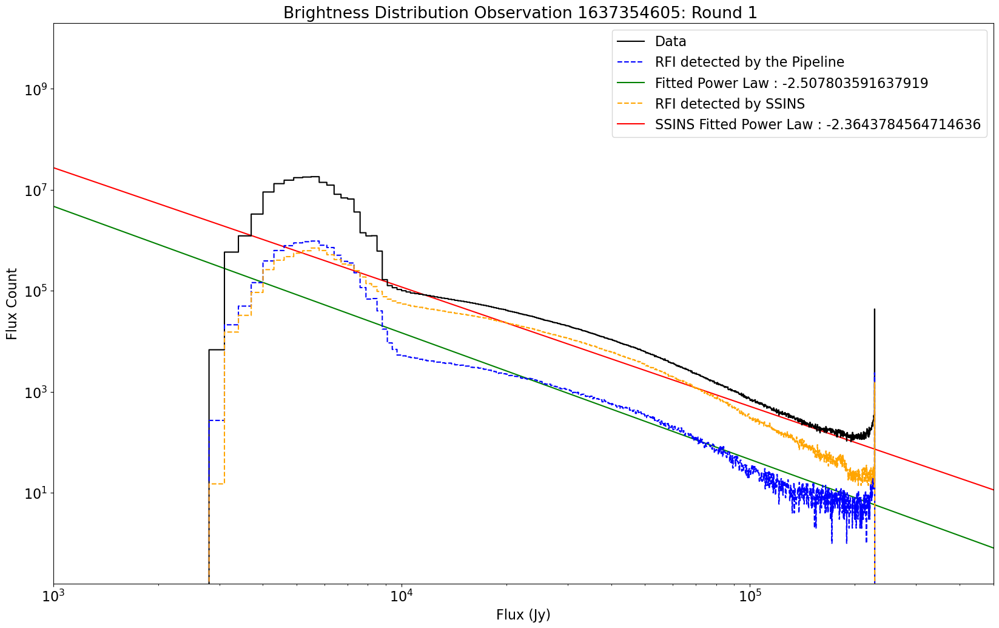

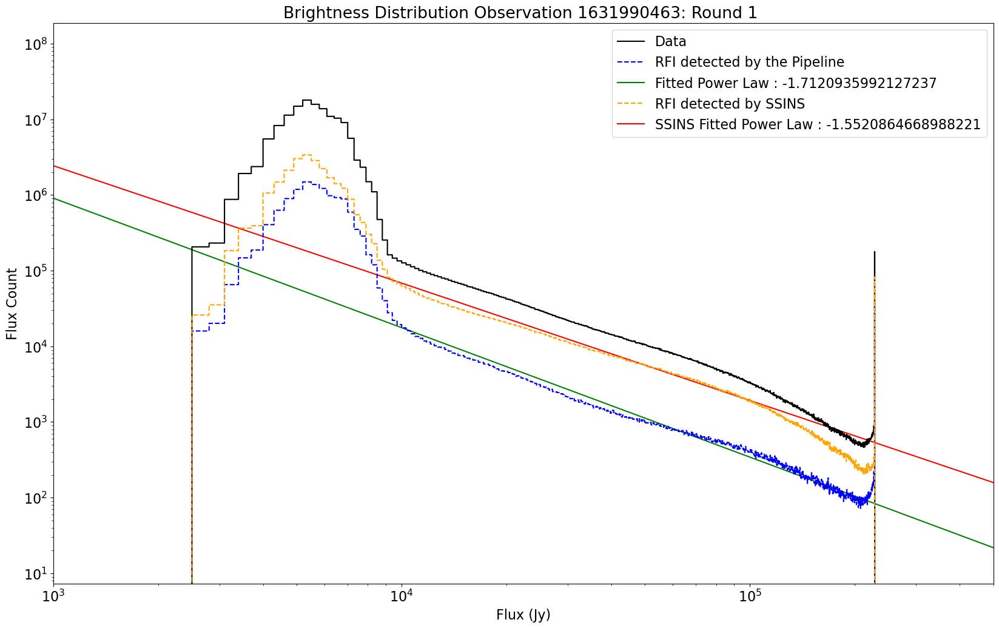

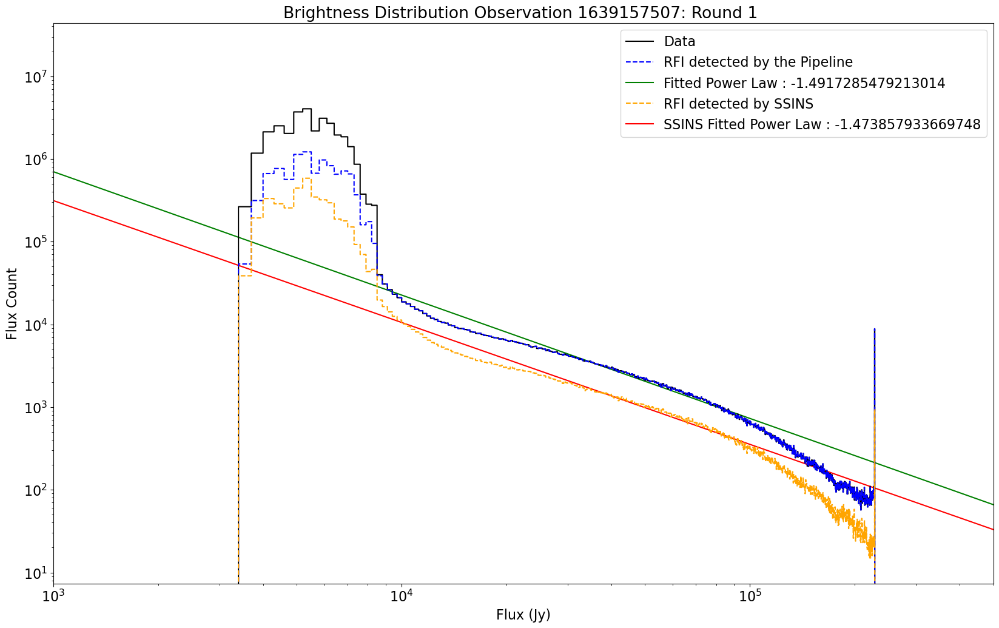

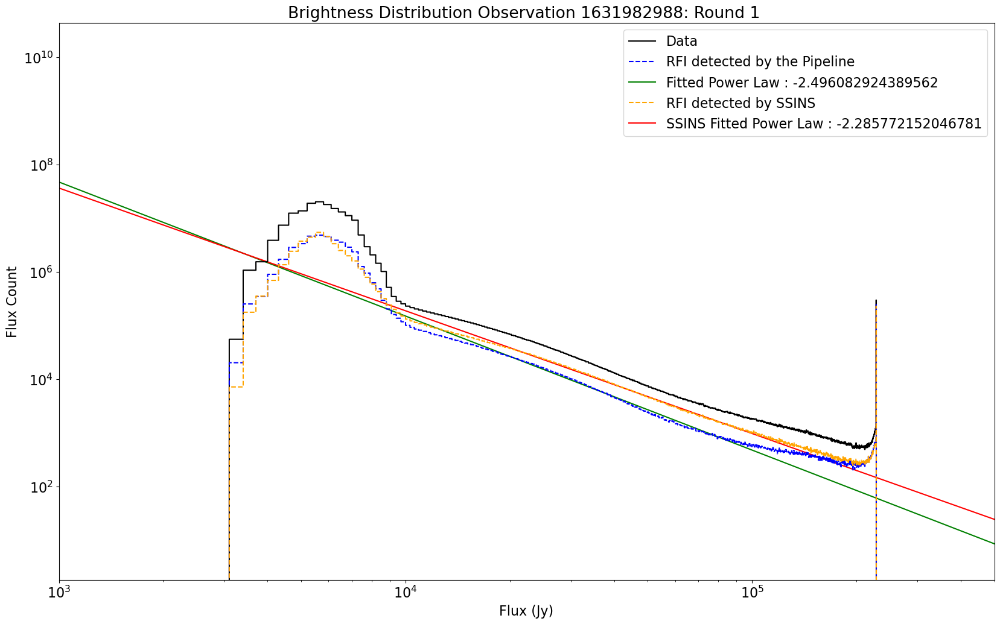

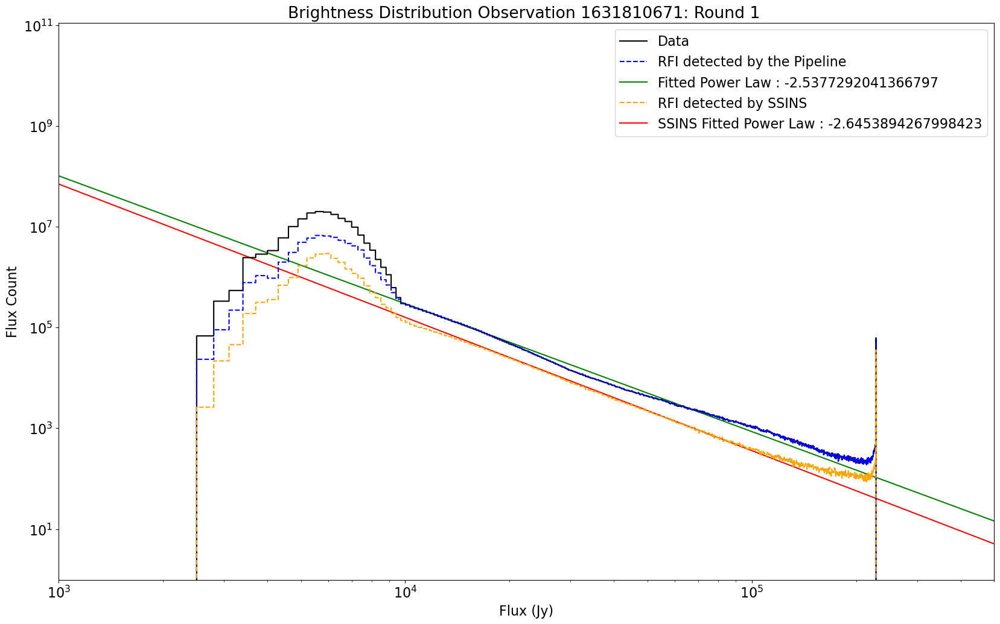

...

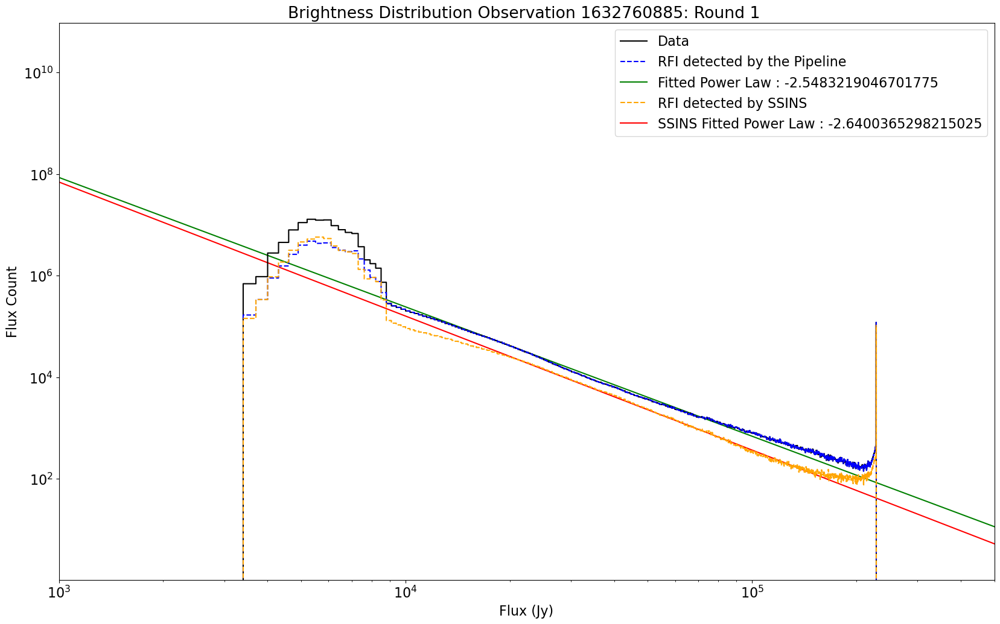

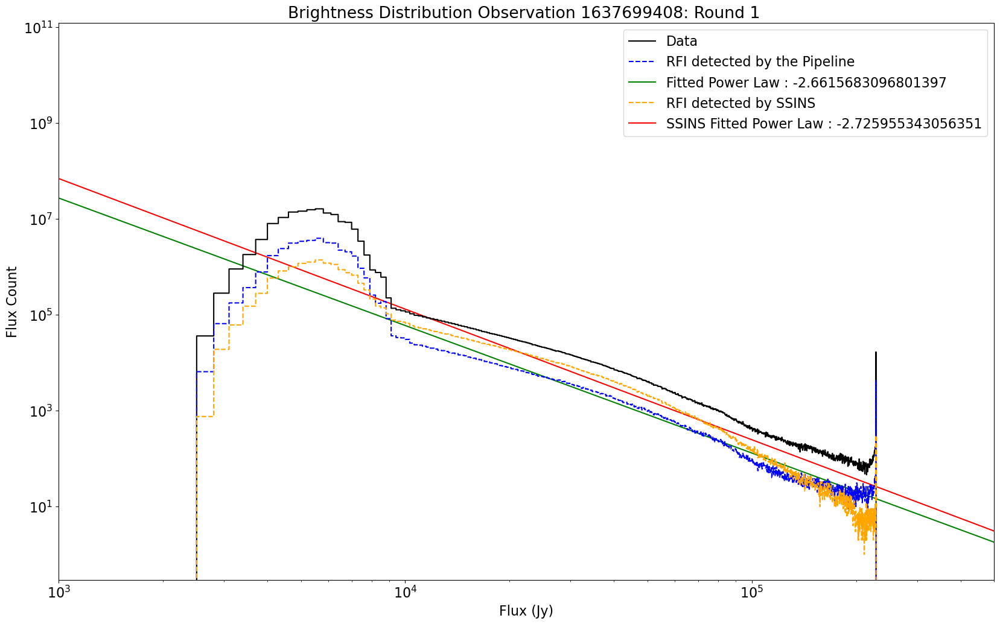

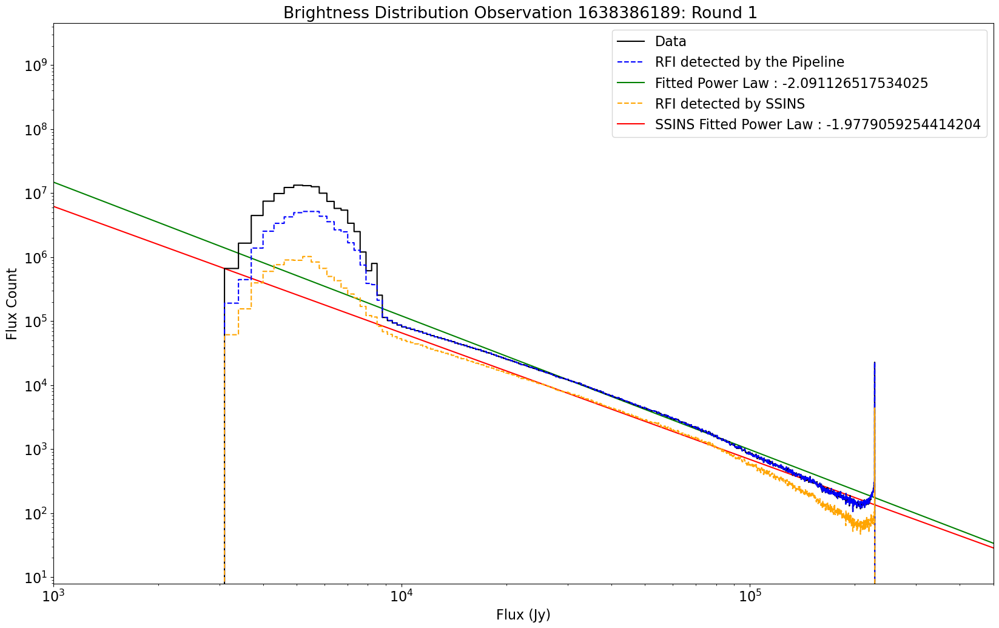

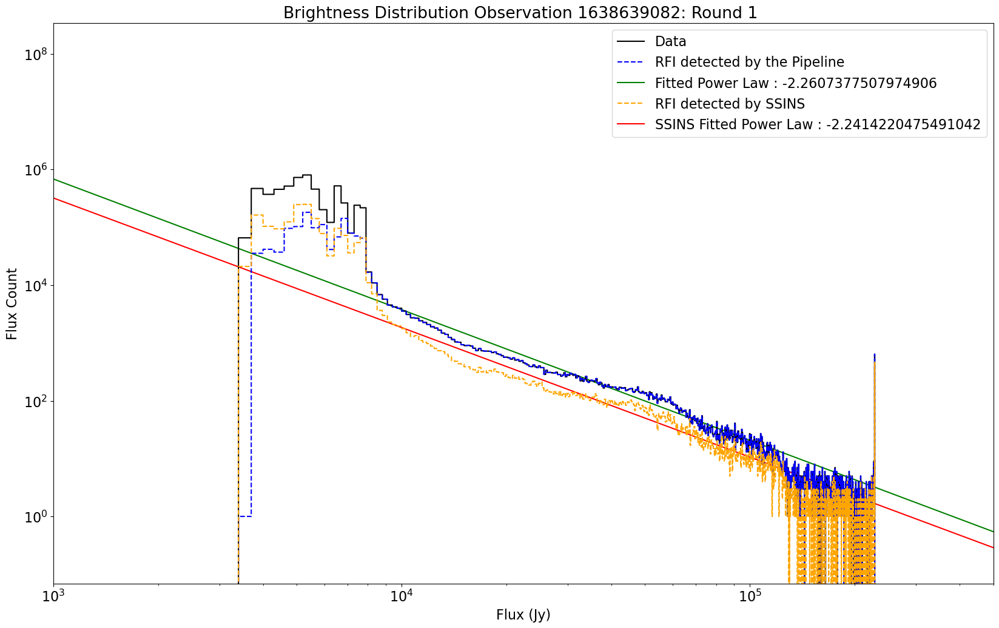

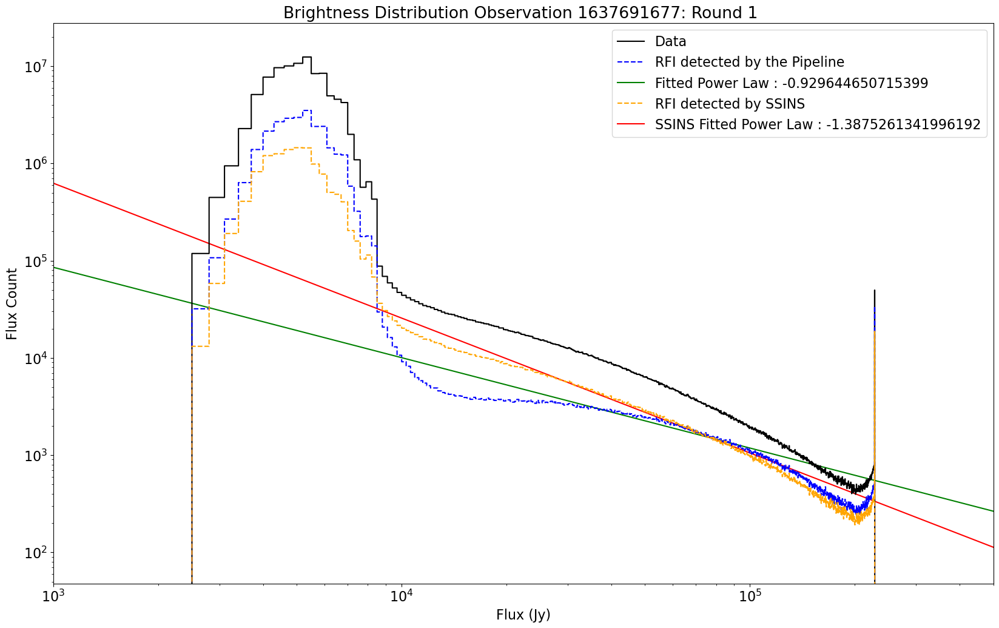

In [15]:
slope_kat = {}
slope_ssins ={}
for f in data_bdist.keys():
    bdist = data_bdist[f][f] 
    # Create a combined histogram for each dataset
    bins_set = bins_set_flux  # Ensure bins_set_flux is defined with appropriate bin edges
    combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
    #combined_cd_norfi, combined_amp_norfi = np.histogram(combined_data_norfi, bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

    factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
    slope_kat[f] = fit
    factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)
    slope_ssins[f] = fit_ssins
    
    fig, ax = plt.subplots(figsize=(20,12))
    #plt.step(combined_amp_data[:-1], combined_cd, label='All Data', color='blue')
    plt.step(combined_amp_data[:-1], combined_cd, label='Data', linestyle='-', zorder=5, color='k')
    plt.step(combined_amp_rfi[:-1], combined_cd_rfi, label='RFI detected by the Pipeline', linestyle='--', zorder=5, color='blue')
    ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit), color='green', label=f'Fitted Power Law : {fit}')
    plt.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI detected by SSINS', linestyle='--', zorder=5, color='orange')
    ax.plot(combined_amp_rfi_ssins, power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins), color='red', label=f'SSINS Fitted Power Law : {fit_ssins}')
    ax.set_xlabel('Flux (Jy)')
    ax.set_ylabel('Flux Count')
    ax.legend()
    plt.xscale('log')
    plt.yscale('log')
    plt.xlim((1e3, 5e5))
    #plt.ylim((0, 1e7))
    plt.title(f'Brightness Distribution Observation {f}: Round 1 ')
    plt.show()

In [16]:
with open('ssins_slope.pkl', 'wb') as f:
    pickle.dump(slope_ssins, f)


with open('ssins_slope.pkl', 'rb') as f:
    loaded_dict = pickle.load(f)


with open('kat_slope.pkl', 'wb') as f:
    pickle.dump(slope_kat, f)


with open('kat_slope.pkl', 'rb') as f:
    loaded_dict = pickle.load(f)


In [17]:
# plot the total brightness distribution for the data block

In [18]:
len(data_bdist.keys()) 

26

In [19]:
# make the total bdist for the round 1 ssins

In [20]:
combined_data_amp = []
combined_data_cd =[]
combined_amp_ssins = []
combined_cd_ssins = []
combined_amp_kat = []
combined_cd_kat = []
factor_kat = []
fit_kat = []
factor_s = []
fit_s = []

#data_bdist.pop('1631667564')
for f in data_bdist.keys():
    bdist = data_bdist[f][f] 
    # Create a combined histogram for each dataset
    bins_set = bins_set_flux  # Ensure bins_set_flux is defined with appropriate bin edges
    combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
    combined_data_amp.append(combined_amp_data)
    combined_data_cd.append(combined_cd)
    
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
    combined_amp_kat.append(combined_amp_rfi)
    combined_cd_kat.append(combined_cd_rfi)

    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)
    combined_amp_ssins.append(combined_amp_rfi_ssins)
    combined_cd_ssins.append(combined_cd_rfi_ssins)

    factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
    factor_kat.append(factor)
    fit_kat.append(fit)
    
    slope_kat[f] = fit
    factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)
    factor_s.append(factor_ssins)
    fit_s.append(fit_ssins)
    slope_ssins[f] = fit_ssins

In [22]:
data_amp =  np.mean(np.array(combined_data_amp), axis=0)

In [23]:
data_cd = np.mean(np.array(combined_data_cd), axis=0)

In [24]:
kat_amp =  np.mean(np.array(combined_amp_kat), axis=0)
ssins_amp = np.mean(np.array(combined_amp_ssins), axis=0)

In [25]:
kat_cd=  np.mean(np.array(combined_cd_kat), axis=0)
ssins_cd = np.mean(np.array(combined_cd_ssins), axis=0)

In [26]:
linewidth = 3.5
linewidth_fit = 2

In [27]:
np.array(factor_kat).shape

(26,)

In [28]:
factor_kat, fit_kat = power_fit(kat_amp, kat_cd)

factor_s, fit_s = power_fit(ssins_amp, ssins_cd)

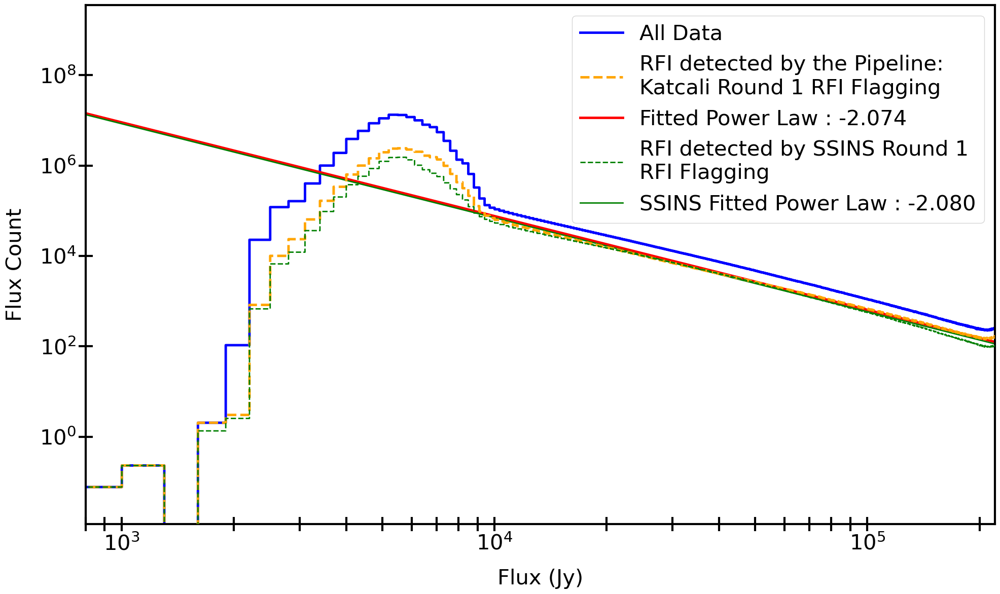

In [29]:
fig, ax = plt.subplots(figsize=(20,12))

plt.step(data_amp[:-1], data_cd, label='All Data', color='blue', linewidth=linewidth)
plt.step(kat_amp[:-1], kat_cd, label='RFI detected by the Pipeline: \nKatcali Round 1 RFI Flagging', linestyle='--', zorder=5, color='orange', linewidth=linewidth)
ax.plot(kat_amp, power_law(kat_amp,factor_kat, fit_kat), color='red', label=f'Fitted Power Law : {fit_kat:.3f}', linewidth=linewidth)

plt.step(ssins_amp[:-1], ssins_cd, label='RFI detected by SSINS Round 1 \nRFI Flagging', linestyle='--', zorder=5, color='g', linewidth=linewidth_fit)
ax.plot(ssins_amp, power_law(ssins_amp, factor_s, fit_s), color='green', label=f'SSINS Fitted Power Law : {fit_s:.3f}', linewidth=linewidth_fit)



#plt.step(amp_rfi_ssins_r2[:-1], cd_rfi_ssins_r2, label='RFI detected by SSINS Round 2 RFI Flagging', linestyle='--', zorder=5, color='b')
#plt.step(combined_amp_norfi[:-1], combined_cd_norfi, label=' Data detected as Non-RFI', color='green')
#ax.errorbar(amp_rfi[:-1], cd_rfi, yerr=np.nanstd(np.array(combined_cd_rfi), axis=0), errorevery=20, label='Katcali bdist errors', fmt='none', color='orange')
#ax.errorbar(amp_rfi_ssins[:-1], cd_rfi_ssins, yerr=np.nanstd(np.array(combined_cd_rfi_ssins), axis=0), errorevery=20, label='SSINS bdist errors', fmt='none', color='k')


ax.set_xlabel('Flux (Jy)', fontsize=30, labelpad=20)
ax.set_ylabel('Flux Count', fontsize=30, labelpad=20)

for spine in ax.spines.values():
    spine.set_linewidth(3)

ax.tick_params(which='both', width=3, length=20, direction='inout', labelsize=30)

ax.legend(loc='upper right', fontsize=30)
plt.xscale('log')
plt.yscale('log')
plt.xlim((0.8e3, 22e4))
#plt.title(f'Brightness Distribution of MeerKLASS 2021 L Band H ')
plt.tight_layout()
plt.savefig('Brightness-dist-with-fits')
plt.show()

In [27]:
#  with the array calculate the histrograms 
combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)

In [30]:
loaded_dict

{'1637354605': np.float64(-2.507803591637919),
 '1631990463': np.float64(-1.7120935992127237),
 '1639157507': np.float64(-1.4917285479213014),
 '1631982988': np.float64(-2.496082924389562),
 '1631810671': np.float64(-2.5377292041366797),
 '1638130295': np.float64(-2.5203976038176132),
 '1631667564': np.float64(-2.4265221550115275),
 '1631387336': np.float64(-1.5631652704788699),
 '1638301944': np.float64(-3.102406386777608),
 '1634252028': np.float64(-2.8433119844512365),
 '1634402485': np.float64(-2.5104637175855613),
 '1632077222': np.float64(-2.018363656798474),
 '1640799689': np.float64(-3.0863281290385505),
 '1632184922': np.float64(-2.753649234714015),
 '1631818149': np.float64(-2.3556200668933545),
 '1630519596': np.float64(-1.5478979944457714),
 '1631732038': np.float64(-2.096876415096122),
 '1632069690': np.float64(-2.12696774236261),
 '1637346562': np.float64(-2.1075650574768843),
 '1631559762': np.float64(-1.7046336177104817),
 '1638294319': np.float64(-2.0975989005318643),


In [32]:
len(data_bdist)

8.666666666666666

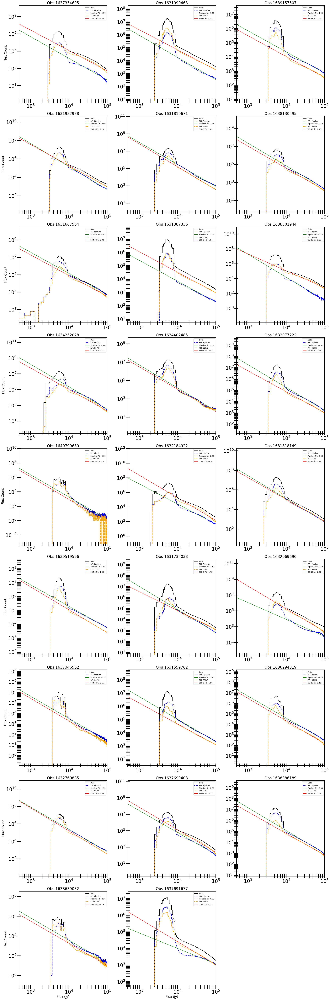

In [36]:
import matplotlib.pyplot as plt
import numpy as np
import math

# Define grid size for wall plot
n = len(data_bdist)
ncols = 3
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(8 * ncols, 8 * nrows)) #sharex=True, sharey=True)
axes = axes.flatten()

for idx, f in enumerate(data_bdist.keys()):
    bdist = data_bdist[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

    # Fit power laws
    factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
    factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)

    ax = axes[idx]
    ax.step(combined_amp_data[:-1], combined_cd, label='Data', linestyle='-', zorder=5, color='k')
    ax.step(combined_amp_rfi[:-1], combined_cd_rfi, label='RFI: Pipeline', linestyle='--', zorder=5, color='blue')
    ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit), color='green', label=f'Pipeline Fit: {fit:.2f}')
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS', linestyle='--', zorder=5, color='orange')
    ax.plot(combined_amp_rfi_ssins, power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins), color='red', label=f'SSINS Fit: {fit_ssins:.2f}')
    
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim((5e2, 1e5))
    ax.set_title(f'Obs {f}')
    if idx % ncols == 0:
        ax.set_ylabel('Flux Count')
    if idx >= (nrows - 1) * ncols:
        ax.set_xlabel('Flux (Jy)')
    ax.tick_params(which='both', width=3, length=20, direction='inout', labelsize=25)

    ax.legend(fontsize=9, loc='upper right')
    for spine in ax.spines.values():
            spine.set_linewidth(2)

# Remove empty subplots if any
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])
fig.savefig('brightness_distribution_wallplot.pdf', bbox_inches='tight')

#fig.suptitle('Brightness Distributions - Wall Plot', fontsize=18)
plt.tight_layout()
plt.show()


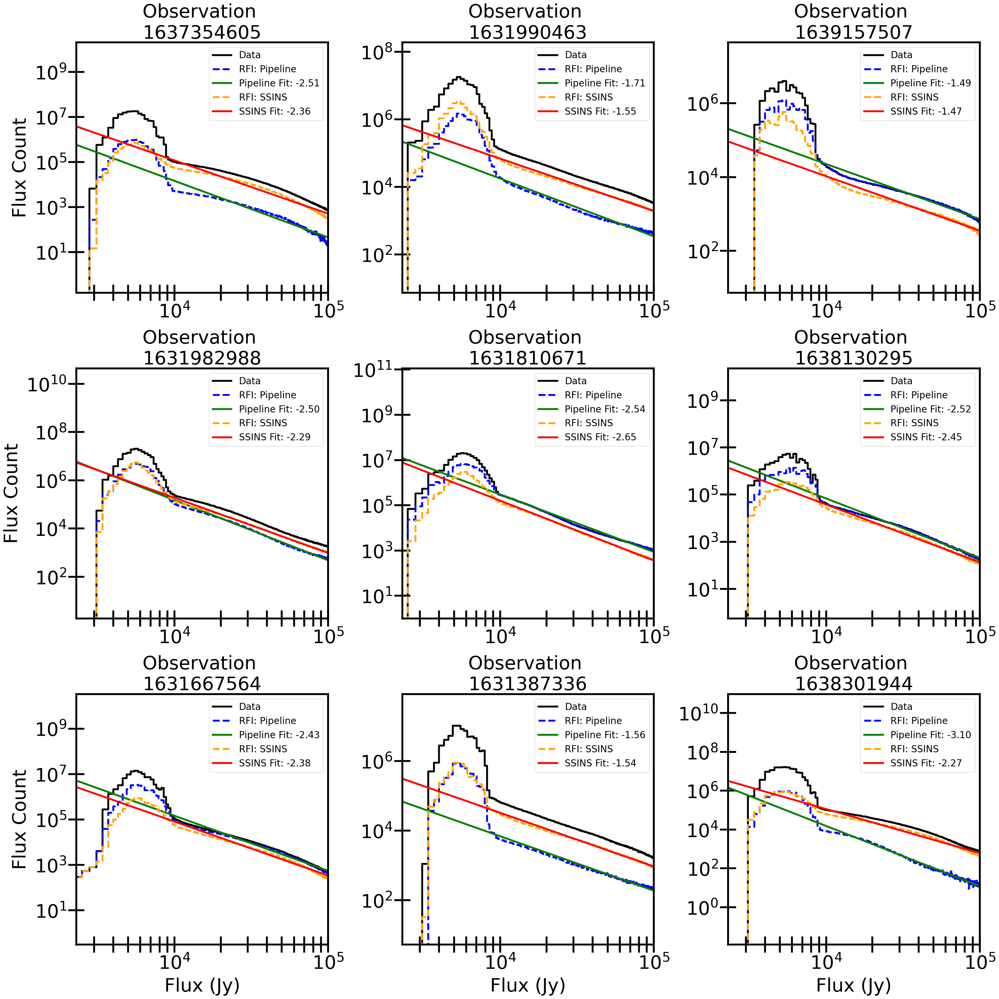

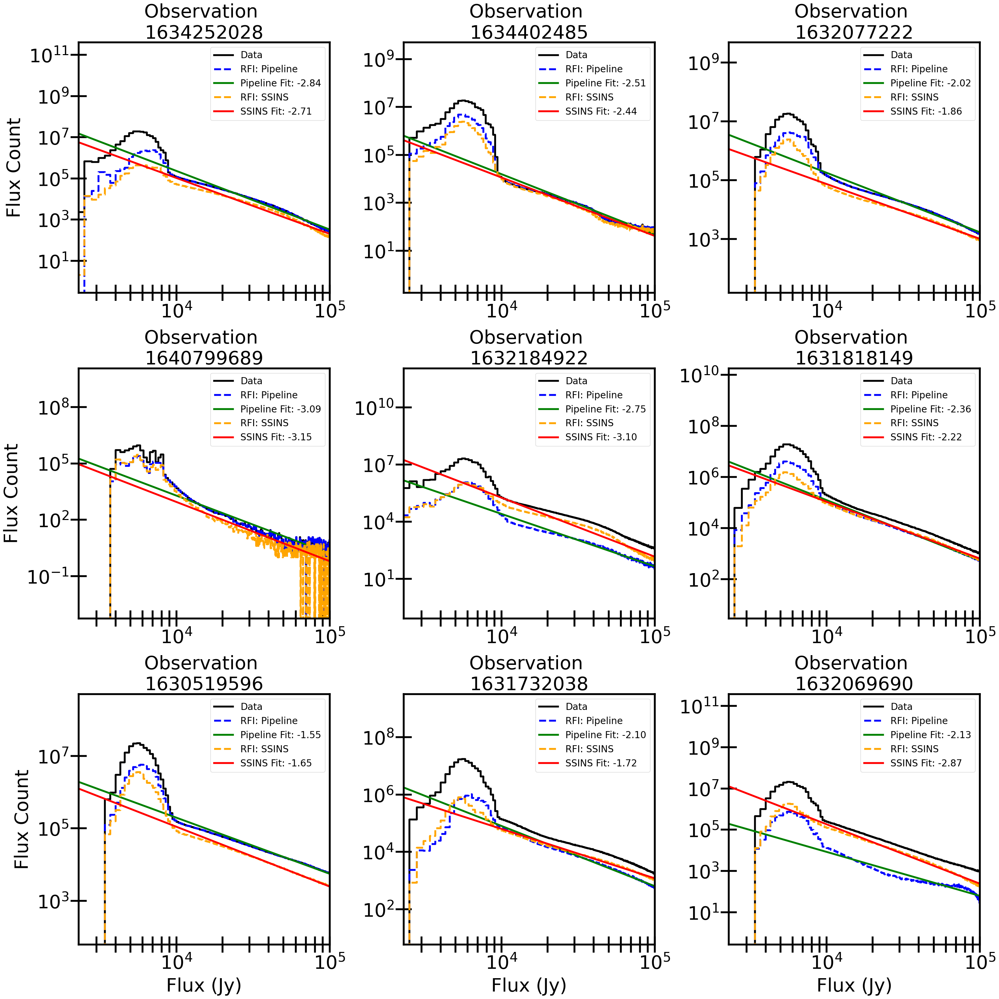

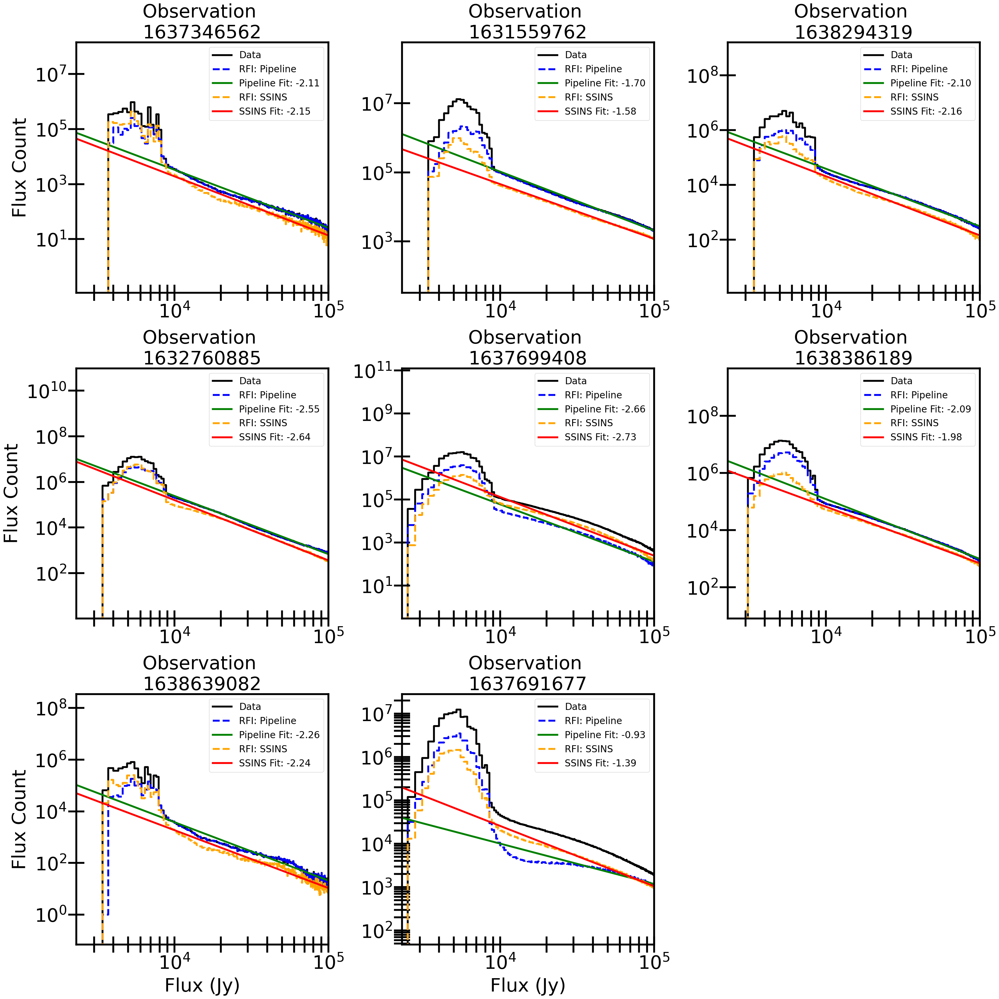

In [47]:
import matplotlib.pyplot as plt
import numpy as np
import math

keys = list(data_bdist.keys())

ncols = 3
nrows = 3
plots_per_fig = ncols * nrows

for page, start in enumerate(range(0, len(data_bdist), plots_per_fig)):

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(10 * ncols, 10 * nrows)
    )
    axes = axes.flatten()

    chunk_keys = keys[start:start + plots_per_fig]

    for idx, f in enumerate(chunk_keys):
        bdist = data_bdist[f][f]
        bins_set = bins_set_flux

        combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
        combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
        combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

        factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
        factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)

        ax = axes[idx]
        ax.step(combined_amp_data[:-1], combined_cd, label='Data', color='k', linewidth=4)
        ax.step(combined_amp_rfi[:-1], combined_cd_rfi, '--', label='RFI: Pipeline', color='blue',linewidth=4)
        ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit),
                color='green', label=f'Pipeline Fit: {fit:.2f}', linewidth=4)
        ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, '--',
                label='RFI: SSINS', color='orange', linewidth=4)
        ax.plot(combined_amp_rfi_ssins,
                power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins),
                color='red', label=f'SSINS Fit: {fit_ssins:.2f}', linewidth=4)

        ax.set_xscale('log')
        ax.set_yscale('log')
        ax.set_xlim((2.3e3, 1e5))
        ax.set_title(f'Observation \n{f}', fontsize=40)

        if idx % ncols == 0:
            ax.set_ylabel('Flux Count', fontsize=40, labelpad=10)
        if idx >= (nrows - 1) * ncols:
            ax.set_xlabel('Flux (Jy)', fontsize=40, labelpad=10)

        ax.tick_params(which='both', width=4, length=35, direction='inout', labelsize=40)
        ax.legend(fontsize=20, loc='upper right')
        for spine in ax.spines.values():
            spine.set_linewidth(4)

    # Remove unused axes
    for j in range(len(chunk_keys), len(axes)):
        fig.delaxes(axes[j])

    fig.tight_layout()
    fig.savefig(f'brightness_distribution_{page+1}.png',
                bbox_inches='tight')


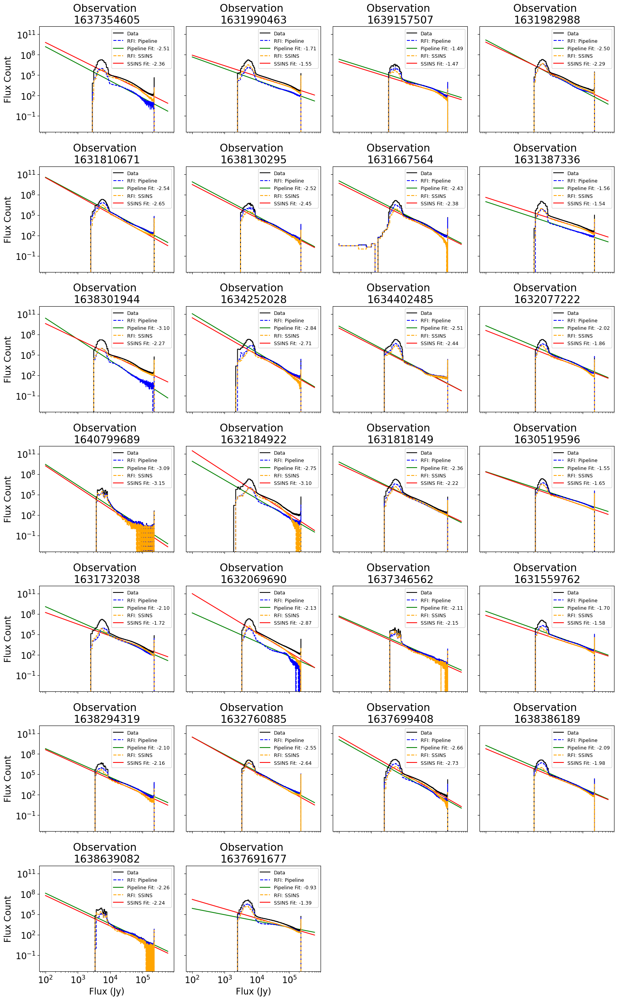

In [30]:
import matplotlib.pyplot as plt
import numpy as np
import math

# Define grid size for wall plot
n = len(data_bdist)
ncols = 4
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 4 * nrows), sharex=True, sharey=True)
axes = axes.flatten()

for idx, f in enumerate(data_bdist.keys()):
    bdist = data_bdist[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

    # Fit power laws
    factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
    factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)

    ax = axes[idx]
    ax.step(combined_amp_data[:-1], combined_cd, label='Data', linestyle='-', zorder=5, color='k')
    ax.step(combined_amp_rfi[:-1], combined_cd_rfi, label='RFI: Pipeline', linestyle='--', zorder=5, color='blue')
    ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit), color='green', label=f'Pipeline Fit: {fit:.2f}')
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS', linestyle='--', zorder=5, color='orange')
    ax.plot(combined_amp_rfi_ssins, power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins), color='red', label=f'SSINS Fit: {fit_ssins:.2f}')
    
    ax.set_xscale('log')
    ax.set_yscale('log')
    #ax.set_xlim((1e3, 1e5))
    ax.set_title(f'Observation \n{f}')
    if idx % ncols == 0:
        ax.set_ylabel('Flux Count')
    if idx >= (nrows - 1) * ncols:
        ax.set_xlabel('Flux (Jy)')
    ax.legend(fontsize=9)

# Remove empty subplots if any
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
fig.savefig('brightness_distribution_wallplot.png', bbox_inches='tight')
#fig.suptitle('Brightness Distributions - Wall Plot', fontsize=18)

plt.show()


In [53]:
# plot the ssins round 1 and ssins round 2 distributions
import os
import pickle
    
folder_path = 'ssins_bdist/bdist_round_2/'  # Replace with your folder path
data_bdist_r2 = {}
fname = []

for filename in os.listdir(folder_path):
      if filename.endswith('_h_rfi_bdist_combine.pickle') or filename.endswith('_h_rfi_bdist_combine.pkl'):
        #print(filename)
        file_prefix = filename.split('_')[0] 
        file_path = os.path.join(folder_path, filename)
        with open(file_path, 'rb') as file:
            data_bdist_r2[file_prefix] = np.load(file, allow_pickle=True)
            fname.append(file_prefix)
        
print(f"Loaded {len(data_bdist)} pickle files.")

Loaded 26 pickle files.


In [54]:
data_bdist.keys()

dict_keys(['1637354605', '1631990463', '1639157507', '1631982988', '1631810671', '1638130295', '1631667564', '1631387336', '1638301944', '1634252028', '1634402485', '1632077222', '1640799689', '1632184922', '1631818149', '1630519596', '1631732038', '1632069690', '1637346562', '1631559762', '1638294319', '1632760885', '1637699408', '1638386189', '1638639082', '1637691677'])

In [55]:
data_bdist_r2.keys()

dict_keys(['1637354605', '1631990463', '1639157507', '1631982988', '1631810671', '1638130295', '1631667564', '1631387336', '1638301944', '1634252028', '1634402485', '1632077222', '1640799689', '1632184922', '1631818149', '1630519596', '1631732038', '1632069690', '1637346562', '1631559762', '1638294319', '1632760885', '1637699408', '1638386189', '1638639082', '1637691677'])

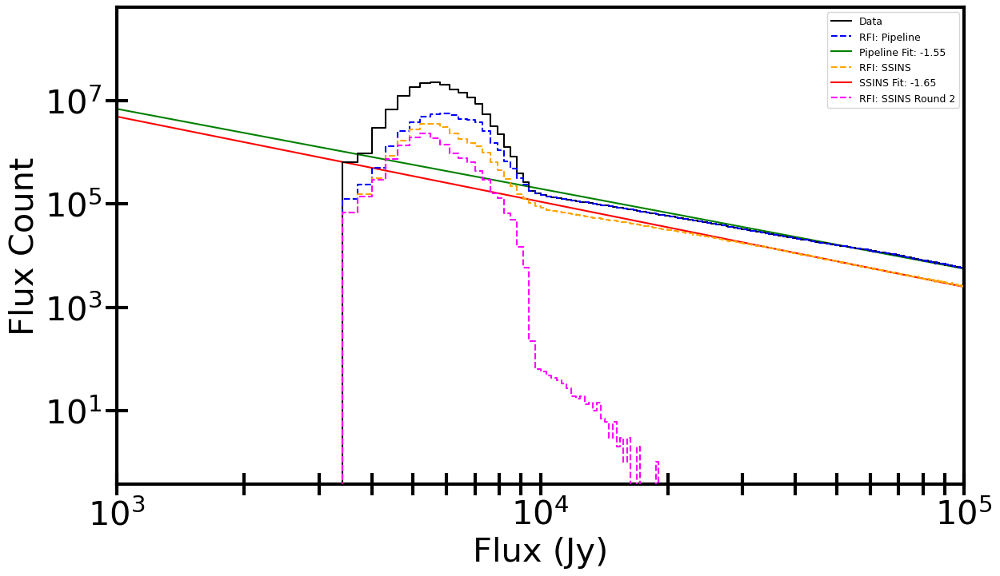

In [69]:
n = len(data_bdist)
ncols = 4
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(46, 50)) #sharex=True, sharey=True)
axes = axes.flatten()

for idx, f in enumerate(data_bdist['1630519596']):
    bdist = data_bdist[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

    # Fit power laws
    factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
    factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)

    ax = axes[idx]
    ax.step(combined_amp_data[:-1], combined_cd, label='Data', linestyle='-', zorder=5, color='k')
    ax.step(combined_amp_rfi[:-1], combined_cd_rfi, label='RFI: Pipeline', linestyle='--', zorder=5, color='blue')
    ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit), color='green', label=f'Pipeline Fit: {fit:.2f}')
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS', linestyle='--', zorder=5, color='orange')
    ax.plot(combined_amp_rfi_ssins, power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins), color='red', label=f'SSINS Fit: {fit_ssins:.2f}')

    bdist_r2 = data_bdist_r2[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist_r2['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist_r2['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist_r2['rfi_ssins'], bins=bins_set)

    
    ax = axes[idx]
    
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS Round 2', linestyle='--', zorder=5, color='magenta')
  
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim((1e3, 1e5))
    #ax.set_title(f'Observation: \n{f}') 
    ax.set_ylabel('Flux Count', fontsize=30)
   
    ax.set_xlabel('Flux (Jy)', fontsize=30)
    ax.legend(fontsize=9, loc='upper right')

    for spine in ax.spines.values():
        spine.set_linewidth(3)

    ax.tick_params(which='both', width=3, length=20, direction='inout', labelsize=30)


# Remove empty subplots if any
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])
fig.savefig('brightness_distribution_wallplot.pdf', bbox_inches='tight')

#fig.suptitle('Brightness Distributions - Wall Plot', fontsize=18)
plt.tight_layout()
plt.show()



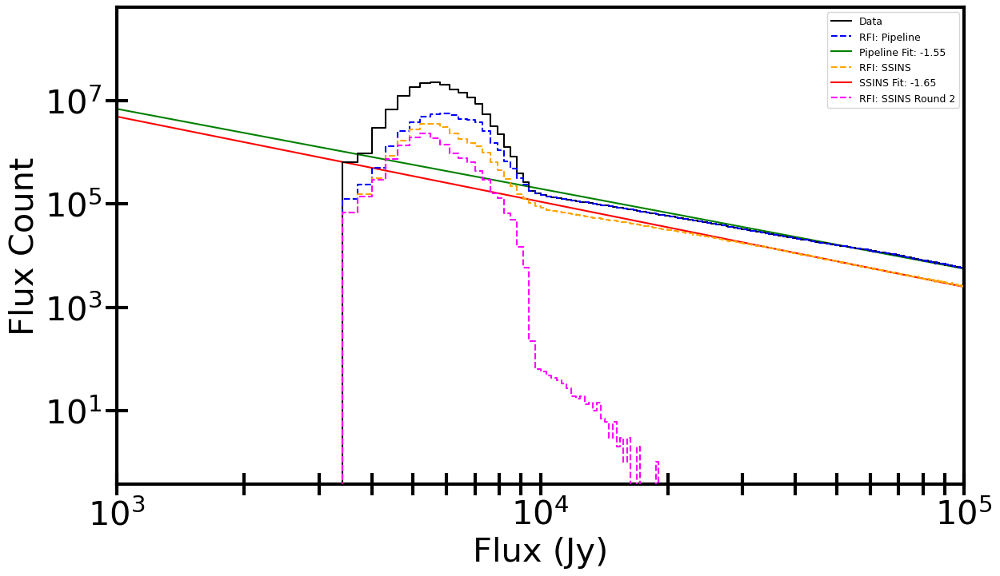

In [63]:
n = len(data_bdist)
ncols = 4
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(46, 50)) #sharex=True, sharey=True)
axes = axes.flatten()

for idx, f in enumerate(data_bdist['1630519596']):
    bdist = data_bdist[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

    # Fit power laws
    factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
    factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)

    ax = axes[idx]
    ax.step(combined_amp_data[:-1], combined_cd, label='Data', linestyle='-', zorder=5, color='k')
    ax.step(combined_amp_rfi[:-1], combined_cd_rfi, label='RFI: Pipeline', linestyle='--', zorder=5, color='blue')
    ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit), color='green', label=f'Pipeline Fit: {fit:.2f}')
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS', linestyle='--', zorder=5, color='orange')
    ax.plot(combined_amp_rfi_ssins, power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins), color='red', label=f'SSINS Fit: {fit_ssins:.2f}')

    bdist_r2 = data_bdist_r2[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist_r2['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist_r2['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist_r2['rfi_ssins'], bins=bins_set)

    
    ax = axes[idx]
    
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS Round 2', linestyle='--', zorder=5, color='magenta')
  
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim((1e3, 1e5))
    #ax.set_title(f'Observation: \n{f}') 
    ax.set_ylabel('Flux Count', fontsize=30)

    
    ax.set_xlabel('Flux (Jy)', fontsize=30)
    ax.legend(fontsize=9, loc='upper right')

    for spine in ax.spines.values():
        spine.set_linewidth(3)

    ax.tick_params(which='both', width=3, length=20, direction='inout', labelsize=30)


# Remove empty subplots if any
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])
fig.savefig('brightness_distribution_wallplot.pdf', bbox_inches='tight')

#fig.suptitle('Brightness Distributions - Wall Plot', fontsize=18)
plt.tight_layout()
plt.show()



In [56]:
# seperate the observation that we dont want
bdist_round_1 = {k: v for k, v in data_bdist.items() if k in fname_trunc}

In [57]:
bdist_round_1.keys() 

dict_keys(['1639157507', '1631810671', '1638130295', '1634252028', '1634402485', '1632077222', '1640799689', '1630519596', '1637346562', '1638294319', '1632760885', '1638386189', '1638639082'])

In [58]:
bdist_round_2 = {k:v for k, v in data_bdist_r2.items() if k  in fname_trunc}

In [59]:
bdist_round_2.keys()

dict_keys(['1639157507', '1631810671', '1638130295', '1634252028', '1634402485', '1632077222', '1640799689', '1630519596', '1637346562', '1638294319', '1632760885', '1638386189', '1638639082'])

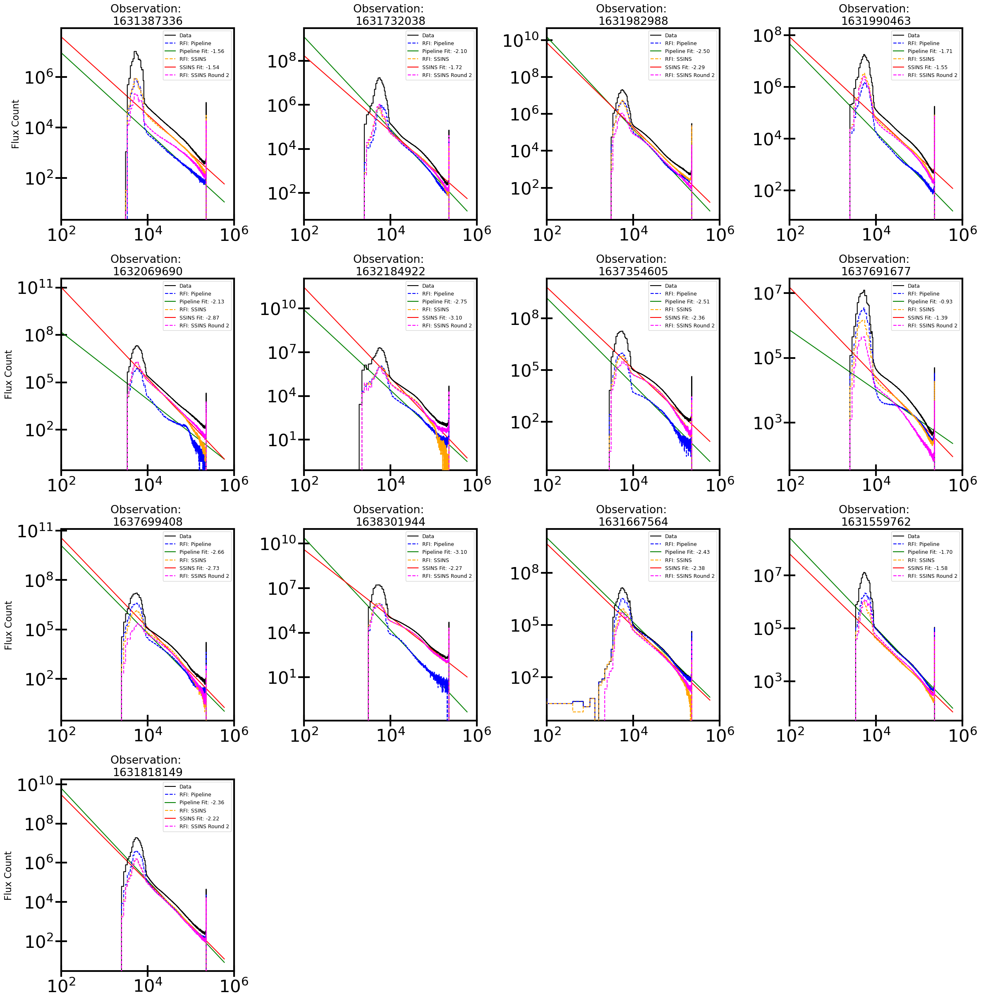

In [60]:
n = len(data_bdist)
ncols = 4
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(6 * ncols, 6 * nrows)) #sharex=True, sharey=True)
axes = axes.flatten()

for idx, f in enumerate(f_rm):
    bdist = data_bdist[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

    # Fit power laws
    factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
    factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)

    ax = axes[idx]
    ax.step(combined_amp_data[:-1], combined_cd, label='Data', linestyle='-', zorder=5, color='k')
    ax.step(combined_amp_rfi[:-1], combined_cd_rfi, label='RFI: Pipeline', linestyle='--', zorder=5, color='blue')
    ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit), color='green', label=f'Pipeline Fit: {fit:.2f}')
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS', linestyle='--', zorder=5, color='orange')
    ax.plot(combined_amp_rfi_ssins, power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins), color='red', label=f'SSINS Fit: {fit_ssins:.2f}')

    bdist_r2 = data_bdist_r2[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist_r2['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist_r2['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist_r2['rfi_ssins'], bins=bins_set)

    
    ax = axes[idx]
    
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS Round 2', linestyle='--', zorder=5, color='magenta')
  
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim((1e2, 1e6))
    ax.set_title(f'Observation: \n{f}')
    if idx % ncols == 0:
        ax.set_ylabel('Flux Count')
    if idx >= (nrows - 1) * ncols:
        ax.set_xlabel('Flux (Jy)')
    ax.legend(fontsize=9, loc='upper right')

    for spine in ax.spines.values():
        spine.set_linewidth(3)

    ax.tick_params(which='both', width=3, length=20, direction='inout', labelsize=30)


# Remove empty subplots if any
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])
fig.savefig('brightness_distribution_wallplot-all-rounds.pdf', bbox_inches='tight')

#fig.suptitle('Brightness Distributions - Wall Plot', fontsize=18)
plt.tight_layout()
plt.show()

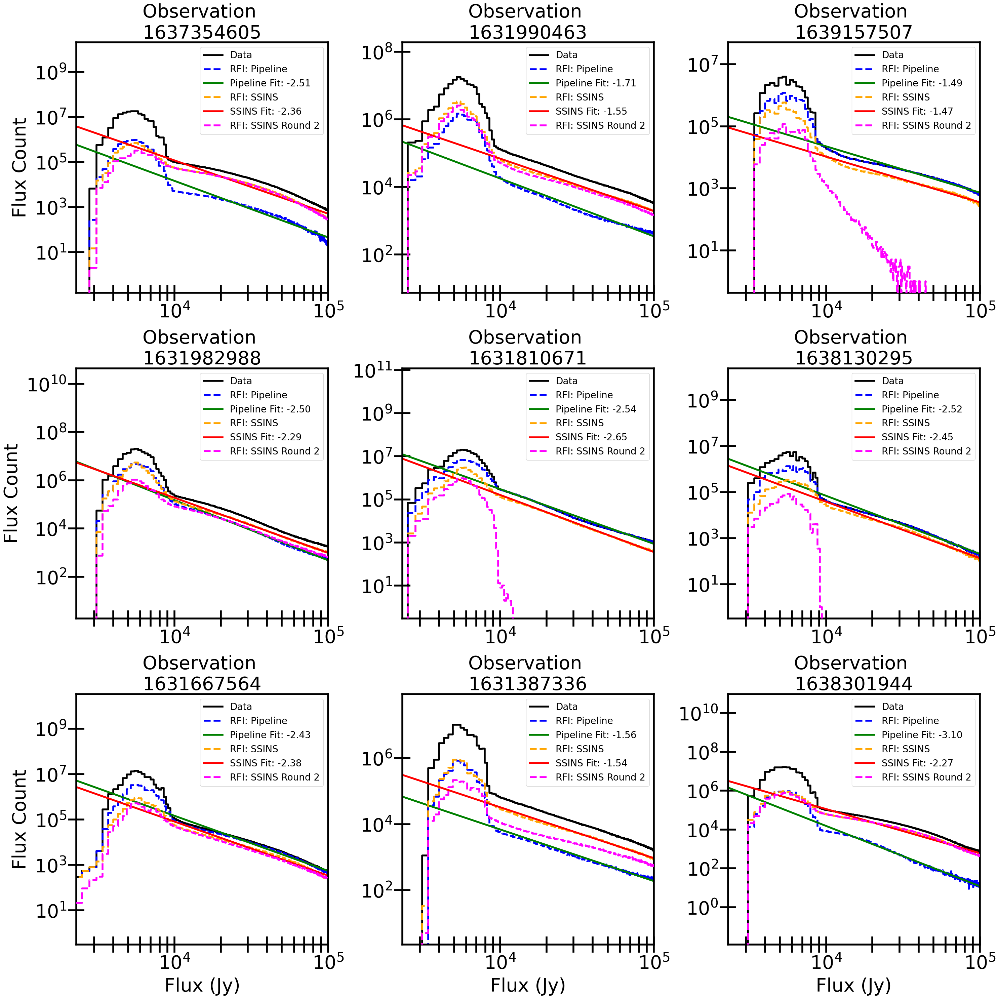

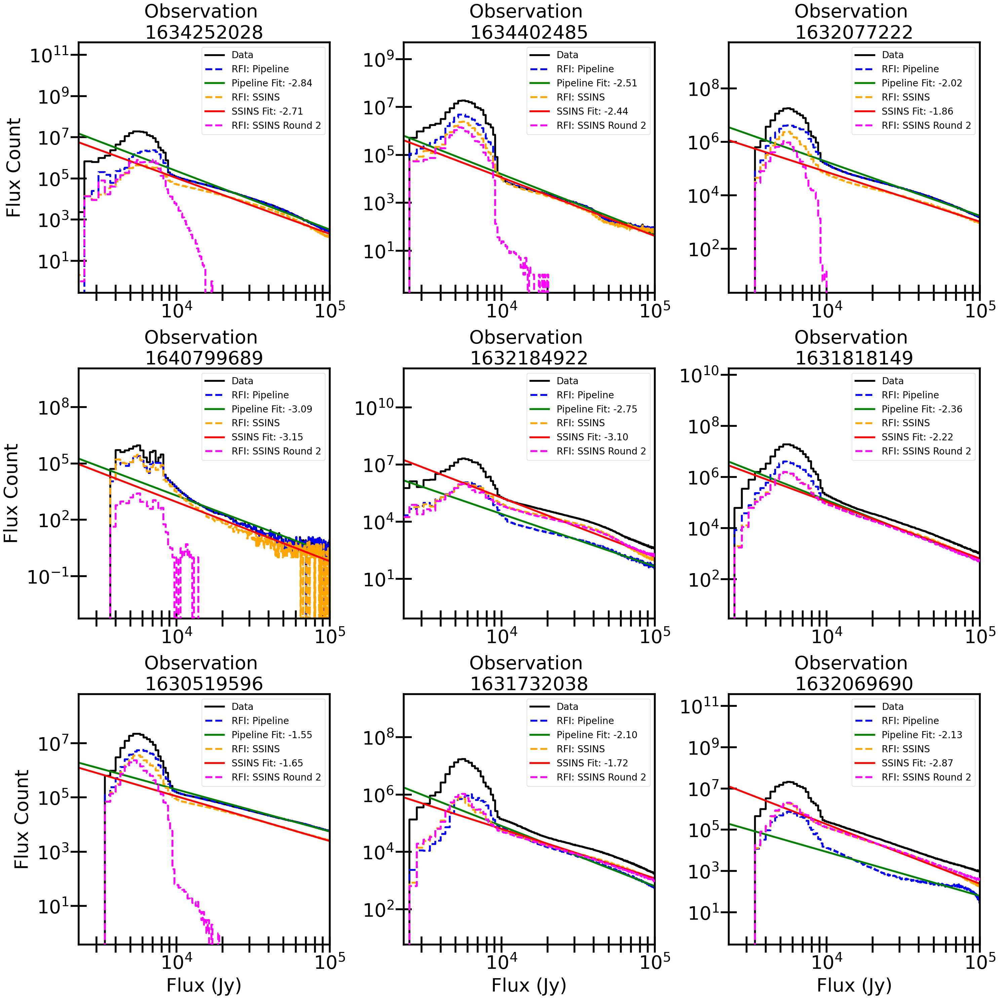

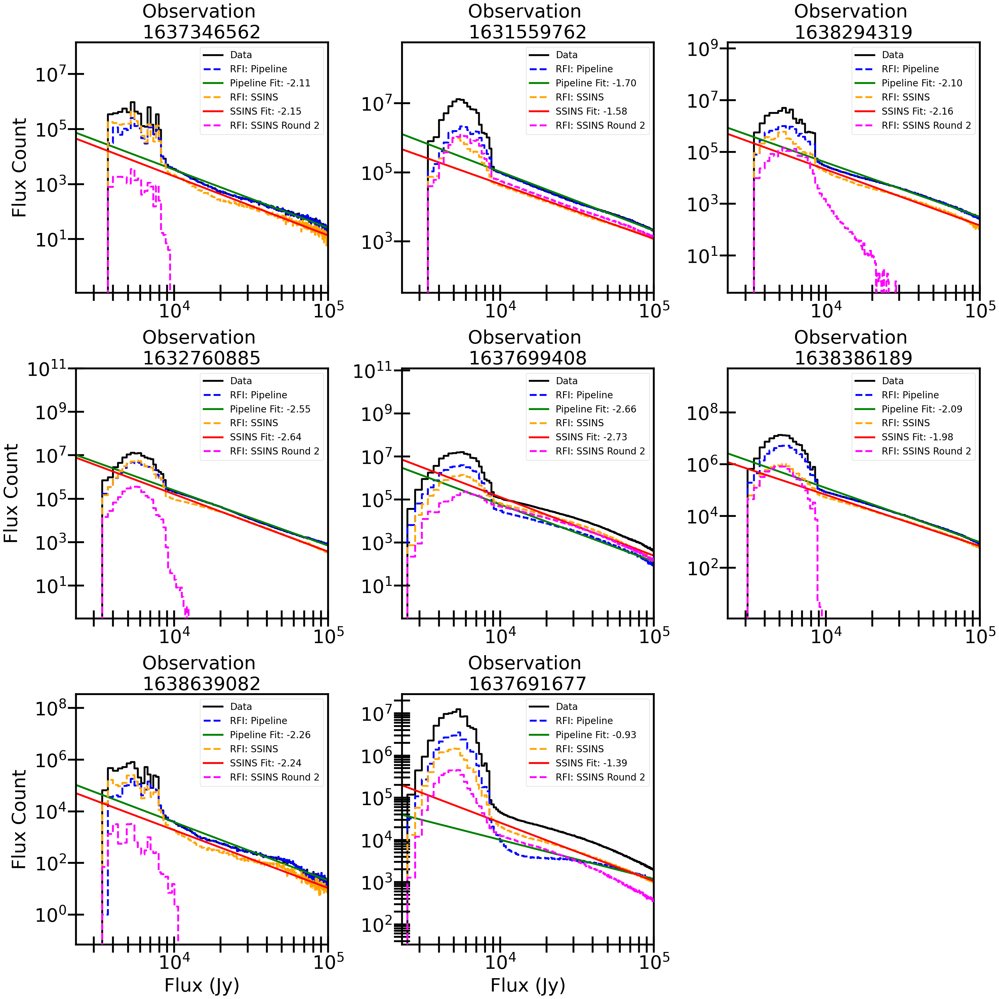

In [66]:
import matplotlib.pyplot as plt
import numpy as np
import math

keys = list(data_bdist.keys())

ncols = 3
nrows = 3
plots_per_fig = ncols * nrows

for page, start in enumerate(range(0, len(data_bdist), plots_per_fig)):

    fig, axes = plt.subplots(
        nrows, ncols,
        figsize=(10 * ncols, 10 * nrows)
    )
    axes = axes.flatten()

    chunk_keys = keys[start:start + plots_per_fig]

    for idx, f in enumerate(chunk_keys):
        bdist = data_bdist[f][f]
        bins_set = bins_set_flux

        combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
        combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
        combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

        factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
        factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)

        ax = axes[idx]
        ax.step(combined_amp_data[:-1], combined_cd, label='Data', color='k', linewidth=4)
        ax.step(combined_amp_rfi[:-1], combined_cd_rfi, '--', label='RFI: Pipeline', color='blue',linewidth=4)
        ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit),
                color='green', label=f'Pipeline Fit: {fit:.2f}', linewidth=4)
        ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, '--',
                label='RFI: SSINS', color='orange', linewidth=4)
        ax.plot(combined_amp_rfi_ssins,
                power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins),
                color='red', label=f'SSINS Fit: {fit_ssins:.2f}', linewidth=4)

        bdist_r2 = data_bdist_r2[f][f] 
        bins_set = bins_set_flux
        combined_cd, combined_amp_data = np.histogram(bdist_r2['data'], bins=bins_set)
        combined_cd_rfi, combined_amp_rfi = np.histogram(bdist_r2['rfi_katcali'], bins=bins_set)
        combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist_r2['rfi_ssins'], bins=bins_set)

        ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS Round 2', linestyle='--', zorder=5, color='magenta', linewidth=4)
  

        ax.set_xscale('log')
        ax.set_yscale('log')
        ax.set_xlim((2.3e3, 1e5))
        ax.set_title(f'Observation \n{f}', fontsize=40)

        if idx % ncols == 0:
            ax.set_ylabel('Flux Count', fontsize=40, labelpad=10)
        if idx >= (nrows - 1) * ncols:
            ax.set_xlabel('Flux (Jy)', fontsize=40, labelpad=10)

        ax.tick_params(which='both', width=4, length=35, direction='inout', labelsize=40)
        ax.legend(fontsize=20, loc='upper right')
        for spine in ax.spines.values():
            spine.set_linewidth(4)

    # Remove unused axes
    for j in range(len(chunk_keys), len(axes)):
        fig.delaxes(axes[j])

    fig.tight_layout()
    fig.savefig(f'brightness_distribution_r1_{page+1}.png',
                bbox_inches='tight')

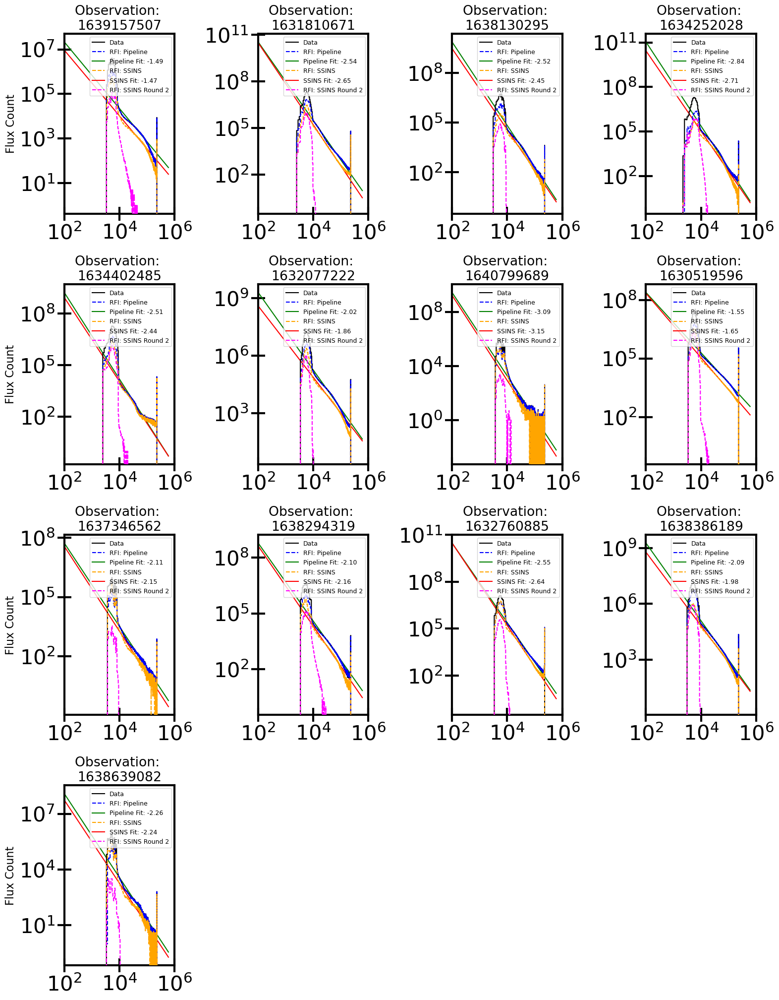

In [48]:
n = len(data_bdist)
ncols = 4
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 5 * nrows)) #sharex=True, sharey=True)
axes = axes.flatten()

for idx, f in enumerate(fname_trunc):
    bdist = data_bdist[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

    # Fit power laws
    factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
    factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)

    ax = axes[idx]
    ax.step(combined_amp_data[:-1], combined_cd, label='Data', linestyle='-', zorder=5, color='k')
    ax.step(combined_amp_rfi[:-1], combined_cd_rfi, label='RFI: Pipeline', linestyle='--', zorder=5, color='blue')
    ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit), color='green', label=f'Pipeline Fit: {fit:.2f}')
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS', linestyle='--', zorder=5, color='orange')
    ax.plot(combined_amp_rfi_ssins, power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins), color='red', label=f'SSINS Fit: {fit_ssins:.2f}')

    bdist_r2 = data_bdist_r2[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist_r2['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist_r2['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist_r2['rfi_ssins'], bins=bins_set)

    
    ax = axes[idx]
    
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS Round 2', linestyle='--', zorder=5, color='magenta')
  
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim((1e2, 1e6))
    ax.set_title(f'Observation: \n{f}')
    if idx % ncols == 0:
        ax.set_ylabel('Flux Count')
    if idx >= (nrows - 1) * ncols:
        ax.set_xlabel('Flux (Jy)')
    ax.legend(fontsize=9, loc='upper right')


    for spine in ax.spines.values():
        spine.set_linewidth(3)

    ax.tick_params(which='both', width=3, length=20, direction='inout', labelsize=30)


# Remove empty subplots if any
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])


#fig.suptitle('Brightness Distributions - Wall Plot', fontsize=18)
plt.tight_layout()
fig.savefig(f'thesis_plots/brightness_distribution_wallplot_with_ r2.pdf')
plt.show()

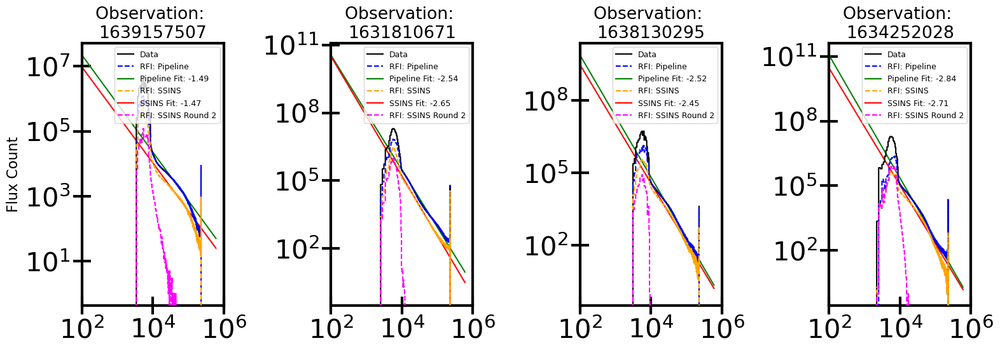

In [64]:
n = len(data_bdist)
ncols = 4
nrows = math.ceil(n / ncols)

fig, axes = plt.subplots(nrows, ncols, figsize=(4 * ncols, 5 * nrows)) #sharex=True, sharey=True)
axes = axes.flatten()

for idx, f in enumerate(fname_trunc[0:4]):
    bdist = data_bdist[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist['rfi_ssins'], bins=bins_set)

    # Fit power laws
    factor, fit = power_fit(combined_amp_rfi, combined_cd_rfi)
    factor_ssins, fit_ssins = power_fit(combined_amp_rfi_ssins, combined_cd_rfi_ssins)

    ax = axes[idx]
    ax.step(combined_amp_data[:-1], combined_cd, label='Data', linestyle='-', zorder=5, color='k')
    ax.step(combined_amp_rfi[:-1], combined_cd_rfi, label='RFI: Pipeline', linestyle='--', zorder=5, color='blue')
    ax.plot(combined_amp_rfi, power_law(combined_amp_rfi, factor, fit), color='green', label=f'Pipeline Fit: {fit:.2f}')
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS', linestyle='--', zorder=5, color='orange')
    ax.plot(combined_amp_rfi_ssins, power_law(combined_amp_rfi_ssins, factor_ssins, fit_ssins), color='red', label=f'SSINS Fit: {fit_ssins:.2f}')

    bdist_r2 = data_bdist_r2[f][f] 
    bins_set = bins_set_flux
    
    # Histogram data
    combined_cd, combined_amp_data = np.histogram(bdist_r2['data'], bins=bins_set)
    combined_cd_rfi, combined_amp_rfi = np.histogram(bdist_r2['rfi_katcali'], bins=bins_set)
    combined_cd_rfi_ssins, combined_amp_rfi_ssins = np.histogram(bdist_r2['rfi_ssins'], bins=bins_set)

    
    ax = axes[idx]
    
    ax.step(combined_amp_rfi_ssins[:-1], combined_cd_rfi_ssins, label='RFI: SSINS Round 2', linestyle='--', zorder=5, color='magenta')
  
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlim((1e2, 1e6))
    ax.set_title(f'Observation: \n{f}')
    if idx % ncols == 0:
        ax.set_ylabel('Flux Count')
    if idx >= (nrows - 1) * ncols:
        ax.set_xlabel('Flux (Jy)')
    ax.legend(fontsize=9, loc='upper right')


    for spine in ax.spines.values():
        spine.set_linewidth(3)

    ax.tick_params(which='both', width=3, length=20, direction='inout', labelsize=30)


# Remove empty subplots if any
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])


#fig.suptitle('Brightness Distributions - Wall Plot', fontsize=18)
plt.tight_layout()
fig.savefig(f'thesis_plots/brightness_distribution_wallplot_with_ r2.pdf')
plt.show()

In [ ]:
# Plot the power-law of these distributions

In [88]:
import os
import pickle
    
folder_path = 'ssins_bdist/pipeline_slope'  # Replace with your folder path
data_slope_katcali = {}
fname = []

for filename in os.listdir(folder_path):
      if filename.endswith('_h_pipeline_slope.pickle') or filename.endswith('_h_pipeline_slope.pkl'):
        #print(filename)
        file_prefix = filename.split('_')[0] 
        file_path = os.path.join(folder_path, filename)
        with open(file_path, 'rb') as file:
            data_slope_katcali[file_prefix] = np.load(file, allow_pickle=True)
            fname.append(file_prefix)
        
print(f"Loaded {len(data_slope_katcali)} pickle files.")

Loaded 25 pickle files.


In [230]:
import os
import pickle
    
folder_path = 'ssins_bdist/ssins_slope'  # Replace with your folder path
data_slope_ssins = {}
fname = []

for filename in os.listdir(folder_path):
      if filename.endswith('_h_ssins_slope.pickle') or filename.endswith('_h_ssins_slope.pkl'):
        #print(filename)
        file_prefix = filename.split('_')[0] 
        file_path = os.path.join(folder_path, filename)
        with open(file_path, 'rb') as file:
            data_slope_ssins[file_prefix] = np.load(file, allow_pickle=True)
            fname.append(file_prefix)
        
print(f"Loaded {len(data_slope_ssins)} pickle files.")

Loaded 25 pickle files.


In [44]:
data_slope_katcali['1631559762']['m000'].keys()

dict_keys(['factor', 'exponent', 'x_data', 'y_data'])

In [160]:
for f, ant_slope in data_slope_katcali.items():
    print(ant_slope)
    print(f)

{'m000': {'factor': np.float64(526458954.0534431), 'exponent': np.float64(-1.3409365895865866), 'x_data': array([  8708.70870871,   9009.00900901,   9309.30930931,   9609.60960961,
         9909.90990991,  10210.21021021,  10510.51051051,  10810.81081081,
        11111.11111111,  11411.41141141,  11711.71171171,  12012.01201201,
        12312.31231231,  12612.61261261,  12912.91291291,  13213.21321321,
        13513.51351351,  13813.81381381,  14114.11411411,  14414.41441441,
        14714.71471471,  15015.01501502,  15315.31531532,  15615.61561562,
        15915.91591592,  16216.21621622,  16516.51651652,  16816.81681682,
        17117.11711712,  17417.41741742,  17717.71771772,  18018.01801802,
        18318.31831832,  18618.61861862,  18918.91891892,  19219.21921922,
        19519.51951952,  19819.81981982,  20120.12012012,  20420.42042042,
        20720.72072072,  21021.02102102,  21321.32132132,  21621.62162162,
        21921.92192192,  22222.22222222,  22522.52252252,  22822.8228

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [163]:
from collections import defaultdict
import numpy as np

# Initialize the accumulator dictionary
sum_dict = defaultdict(float)

# Loop over antennas
for ant, data in data_slope_katcali['1631559762'].items():
    for key in ['factor', 'exponent', 'x_data', 'y_data']:
        value = data.get(key)
        if isinstance(value, (int, float)):
            sum_dict[key] += value
        elif isinstance(value, list) or isinstance(value, np.ndarray):
            sum_dict[key] += np.sum(value, axis=0)
        else:
            raise TypeError(f"Unsupported type for key '{key}': {type(value)}")

# Convert back to regular dict if you want
sum_result = dict(sum_dict)


In [164]:
sum_result

{'factor': np.float64(1193597783143978.2),
 'exponent': np.float64(-59.20745928430857),
 'x_data': np.float64(580232732.7327329),
 'y_data': np.float64(4417124.0)}

In [166]:
from collections import defaultdict
import numpy as np

# Temporary storage for accumulating values
accumulator = defaultdict(list)

# Collect all values per key
for ant_data in data_slope_katcali['1631559762'].values():
    for key in ['factor', 'exponent', 'x_data', 'y_data']:
        value = ant_data.get(key)
        accumulator[key].append(np.array(value))  # convert scalars to arrays too

# Compute averages
average_result = {}
for key, values in accumulator.items():
    stacked = np.stack(values)
    average_result[key] = np.mean(stacked, axis=0)

# average_result now contains mean of each key across antennas


In [167]:
average_result

{'factor': np.float64(34102793804113.664),
 'exponent': np.float64(-1.6916416938373877),
 'x_data': array([  8708.70870871,   9009.00900901,   9309.30930931,   9609.60960961,
          9909.90990991,  10210.21021021,  10510.51051051,  10810.81081081,
         11111.11111111,  11411.41141141,  11711.71171171,  12012.01201201,
         12312.31231231,  12612.61261261,  12912.91291291,  13213.21321321,
         13513.51351351,  13813.81381381,  14114.11411411,  14414.41441441,
         14714.71471471,  15015.01501502,  15315.31531532,  15615.61561562,
         15915.91591592,  16216.21621622,  16516.51651652,  16816.81681682,
         17117.11711712,  17417.41741742,  17717.71771772,  18018.01801802,
         18318.31831832,  18618.61861862,  18918.91891892,  19219.21921922,
         19519.51951952,  19819.81981982,  20120.12012012,  20420.42042042,
         20720.72072072,  21021.02102102,  21321.32132132,  21621.62162162,
         21921.92192192,  22222.22222222,  22522.52252252,  22822

In [168]:
average_result.keys()

dict_keys(['factor', 'exponent', 'x_data', 'y_data'])

In [ ]:
#add the plot of the slope index, and observation time

In [194]:
slope_kat

{'1637354605': np.float64(-2.507803591637919),
 '1631990463': np.float64(-1.7120935992127237),
 '1639157507': np.float64(-1.4917285479213014)}

In [195]:
slope_ssins

{'1637354605': np.float64(-2.3643784564714636),
 '1631990463': np.float64(-1.5520864668988221),
 '1639157507': np.float64(-1.473857933669748)}

In [10]:
fload = kio.load_data(f)

In [14]:
fload.obs_script_log

['2021-11-23 18:21:04.270Z INFO     ==========================',
 '2021-11-23 18:21:04.270Z INFO     New data capturing session',
 '2021-11-23 18:21:04.270Z INFO     --------------------------',
 "2021-11-23 18:21:04.271Z INFO     Session CBF = 'cbf' (1 fengine, 2 beamformers, 1 correlator)",
 '2021-11-23 18:21:04.271Z INFO     CBF instruments and streams:',
 "2021-11-23 18:21:04.271Z INFO       -> 'wide' (1 fengine, 2 beamformers, 1 correlator)",
 "2021-11-23 18:21:04.272Z INFO            -> fengine    'wide.antenna-channelised-voltage' (128 inputs)",
 "2021-11-23 18:21:04.272Z INFO            -> beamformer 'wide.tied-array-channelised-voltage.0y' (64 inputs)",
 "2021-11-23 18:21:04.272Z INFO            -> beamformer 'wide.tied-array-channelised-voltage.0x' (64 inputs)",
 "2021-11-23 18:21:04.272Z INFO            -> correlator 'wide.baseline-correlation-products' (128 inputs)",
 "2021-11-23 18:21:04.272Z INFO     Session SDP = 'sdp' (1 product)",
 '2021-11-23 18:21:04.272Z INFO     SD

In [18]:
print(fload)

Name: 1637691677_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: file:///idia/projects/hi_im/MEERKLASS-1/SCI-20210212-MS-01/1637691677/1637691677/1637691677_sdp_l0.full.rdb
Observer: Sean Passmoor  Experiment ID: 20211123-0014
Description: 'HI Intensity observation SETTING epoch 7'
Observed from 2021-11-23 20:22:57.140 SAST to 2021-11-23 22:26:22.008 SAST
Dump rate / period: 0.50021 Hz / 1.999 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m009,m010,m011,m012,m013,m014,m015,m016,m017,m018,m019,m020,m021,m022,m023,m024,m025,m026,m027,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m042,m043,m044,m045,m046,m047,m048,m049,m050,m051,m052,m054,m056,m057,m058,m059,m060,m062,m063  118      236
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 L    c856M4k    1284.000         856.000          

In [39]:
[ k for k in fload.sensor.keys() if 'Timestamps' in k]

['Timestamps/mjd']

In [47]:
fload.timestamps[-1]

np.float64(1637699181.007936)

In [50]:
t = katpoint.Timestamp(1.63769178e+09)

In [48]:
katpoint.Timestamp(1637699181.007936).local()

'2021-11-23 22:26:21.008 SAST'

In [67]:

date = {}
for f in fname_trunc:
    fload = kio.load_data(f)
    t0=fload.timestamps[0]
    local_time = katpoint.Timestamp(t0).local()
    date_only = local_time[:10] 
    date[f] = date_only
    

In [68]:
date_all = {}
date = {}
for f in fname_trunc:
    fload = kio.load_data(f)
    t0=fload.timestamps[0]
    local_time = katpoint.Timestamp(t0).local()
    date_only = local_time[:10]
    date_all[f] = local_time 
    date[f] = date_only
    

In [69]:
date

{'1639157507': '2021-12-10',
 '1631810671': '2021-09-16',
 '1638130295': '2021-11-28',
 '1634252028': '2021-10-15',
 '1634402485': '2021-10-16',
 '1632077222': '2021-09-19',
 '1640799689': '2021-12-29',
 '1630519596': '2021-09-01',
 '1637346562': '2021-11-19',
 '1638294319': '2021-11-30',
 '1632760885': '2021-09-27',
 '1638386189': '2021-12-01',
 '1638639082': '2021-12-04'}

In [75]:
import collections

sorted_dict = collections.OrderedDict(date_all)

# sorted_dict

In [76]:
common_files = sorted(set(date) & set(slope_ssins) & set(slope_kat))


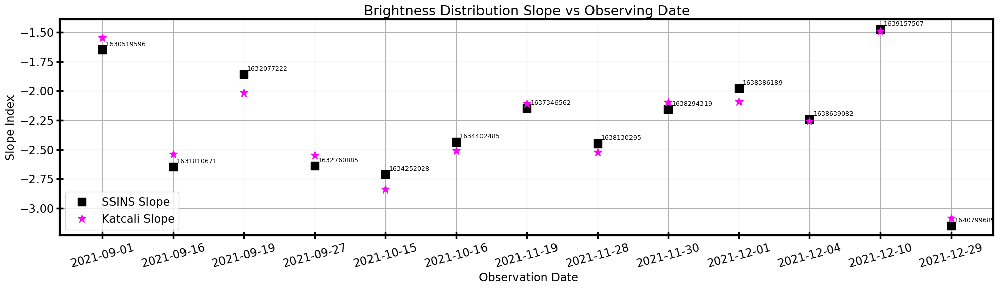

In [78]:
# Extract dates and slopes
dates = [date[f] for f in common_files]
slopes = [slope_ssins[f] for f in common_files]
slopes_kat = [slope_kat[f] for f in common_files]

# Plot
plt.figure(figsize=(20, 6))
plt.plot(dates, slopes, marker='s', ls='', label='SSINS Slope', ms=12, color='black')
plt.plot(dates, slopes_kat, marker='*', ls='', label='Katcali Slope', color='magenta', ms=12)
plt.xlabel(" Observation Date")
plt.ylabel("Slope Index")
#plt.title("Brightness Distribution Slope vs Observing Date")
plt.grid(True)
for f, x, y in zip(common_files, dates, slopes):
    plt.annotate(f, (x, y), textcoords="offset points", xytext=(5, 5), ha='left', fontsize=9)

plt.tight_layout()
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.xticks(rotation=15)
plt.subplots_adjust(bottom=0.2)
plt.legend()
plt.grid(True)
ax = plt.gca()  # get current axes
for spine in ax.spines.values():
    spine.set_linewidth(3) 
ax.tick_params(which='both', width=2.5, length=10, direction='inout')
plt.savefig('slope_vs_obs_date')

plt.show()

In [79]:
date26_all_end = {}
date26_end = {}
for f in fname:
    fload = kio.load_data(f)
    t1=fload.timestamps[-1]
    local_time = katpoint.Timestamp(t1).local()
    date_only = local_time[:10]
    date26_all_end[f] = local_time 
    date26_end[f] = date_only

In [80]:
date26_all_end

{'1637354605': '2021-11-20 00:50:05.611 SAST',
 '1631990463': '2021-09-18 22:36:30.263 SAST',
 '1639157507': '2021-12-10 21:38:58.523 SAST',
 '1631982988': '2021-09-18 20:39:04.743 SAST',
 '1631810671': '2021-09-16 20:47:12.526 SAST',
 '1638130295': '2021-11-29 00:25:36.028 SAST',
 '1631667564': '2021-09-15 05:04:43.200 SAST',
 '1631387336': '2021-09-11 23:05:48.865 SAST',
 '1638301944': '2021-12-01 00:05:07.031 SAST',
 '1634252028': '2021-10-15 03:06:41.905 SAST',
 '1634402485': '2021-10-16 20:39:00.469 SAST',
 '1632077222': '2021-09-19 22:43:55.795 SAST',
 '1640799689': '2021-12-29 21:54:12.149 SAST',
 '1632184922': '2021-09-21 04:50:11.218 SAST',
 '1631818149': '2021-09-16 22:46:26.500 SAST',
 '1630519596': '2021-09-01 22:08:22.140 SAST',
 '1631732038': '2021-09-15 22:49:48.360 SAST',
 '1632069690': '2021-09-19 20:44:59.814 SAST',
 '1637346562': '2021-11-19 22:35:24.030 SAST',
 '1631559762': '2021-09-13 22:59:35.371 SAST',
 '1638294319': '2021-11-30 21:50:29.948 SAST',
 '1632760885'

In [81]:
date26_all = {}
date26 = {}
for f in fname:
    fload = kio.load_data(f)
    t0=fload.timestamps[0]
    local_time = katpoint.Timestamp(t0).local()
    date_only = local_time[:10]
    date26_all[f] = local_time 
    date26[f] = date_only

In [82]:
common_files = sorted(set(date26) & set(slope_ssins) & set(slope_kat))

In [83]:
dates = [date26[f] for f in common_files]

In [84]:
date26

{'1637354605': '2021-11-19',
 '1631990463': '2021-09-18',
 '1639157507': '2021-12-10',
 '1631982988': '2021-09-18',
 '1631810671': '2021-09-16',
 '1638130295': '2021-11-28',
 '1631667564': '2021-09-15',
 '1631387336': '2021-09-11',
 '1638301944': '2021-11-30',
 '1634252028': '2021-10-15',
 '1634402485': '2021-10-16',
 '1632077222': '2021-09-19',
 '1640799689': '2021-12-29',
 '1632184922': '2021-09-21',
 '1631818149': '2021-09-16',
 '1630519596': '2021-09-01',
 '1631732038': '2021-09-15',
 '1632069690': '2021-09-19',
 '1637346562': '2021-11-19',
 '1631559762': '2021-09-13',
 '1638294319': '2021-11-30',
 '1632760885': '2021-09-27',
 '1637699408': '2021-11-23',
 '1638386189': '2021-12-01',
 '1638639082': '2021-12-04',
 '1637691677': '2021-11-23'}

In [85]:
slopes_kat

[np.float64(-1.5478979944457714),
 np.float64(-2.5377292041366797),
 np.float64(-2.018363656798474),
 np.float64(-2.5483219046701775),
 np.float64(-2.8433119844512365),
 np.float64(-2.5104637175855613),
 np.float64(-2.1075650574768843),
 np.float64(-2.5203976038176132),
 np.float64(-2.0975989005318643),
 np.float64(-2.091126517534025),
 np.float64(-2.2607377507974906),
 np.float64(-1.4917285479213014),
 np.float64(-3.0863281290385505)]

In [86]:
common_files

['1630519596',
 '1631387336',
 '1631559762',
 '1631667564',
 '1631732038',
 '1631810671',
 '1631818149',
 '1631982988',
 '1631990463',
 '1632069690',
 '1632077222',
 '1632184922',
 '1632760885',
 '1634252028',
 '1634402485',
 '1637346562',
 '1637354605',
 '1637691677',
 '1637699408',
 '1638130295',
 '1638294319',
 '1638301944',
 '1638386189',
 '1638639082',
 '1639157507',
 '1640799689']

In [87]:
slopes_kat = [slope_kat[f] for f in common_files]

In [262]:
for key in f_rm:
    if key in slope_kat:
        slope_kat[key] = np.nan

In [117]:
common_files_trunc = ['1630519596',
 '1631387336',
 '1631559762',
 '1631667564',
 '1631732038',
 '1631810671',
 '1631818149',
 '1631982988',
 '1631990463',
 '1632069690',
 '1632077222',
 '1632184922',
 '1632760885',
 '1634252028',
 '1634402485',
 '1637346562',
 '1637354605',
 '1637691677',
 '1637699408',
 '1638130295',
 '1638294319',
 '1638301944',
 '1638386189',
 '1638639082',
 '1639157507',
 '1640799689']

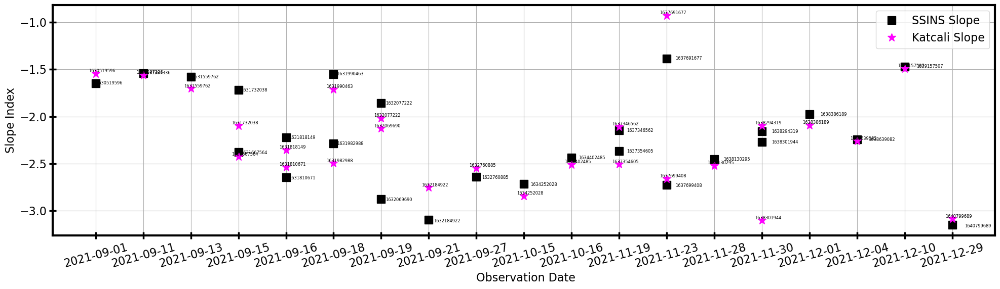

In [131]:
dates = [date26[f] for f in common_files]
slopes = [slope_ssins[f] for f in common_files]
slopes_kat = [slope_kat[f] for f in common_files]

# Plot
plt.figure(figsize=(20, 6))
plt.plot(dates, slopes, marker='s', ls='', label='SSINS Slope', ms=12, color='black')
plt.plot(dates, slopes_kat, marker='*', ls='', label='Katcali Slope', color='magenta', ms=12)
plt.xlabel(" Observation Date")
plt.ylabel("Slope Index")
#plt.title("Brightness Distribution Slope vs Observing Date")
plt.grid(True)
for f, x, y in zip(common_files, dates, slopes):
    plt.annotate(f, (x, y), textcoords="offset points", ha='left', va='baseline', fontsize=6)
for f, x, y in zip(common_files_trunc, dates, slopes_kat):
    plt.annotate(f, (x, y), textcoords="offset points", xytext=(-10, 0.5), ha='left',va='bottom', fontsize=6)

plt.tight_layout()
plt.xticks(rotation=45)
plt.legend()
plt.tight_layout()
plt.xticks(rotation=15)
plt.subplots_adjust(bottom=0.2)
plt.legend()
plt.grid(True)
ax = plt.gca()  # get current axes
for spine in ax.spines.values():
    spine.set_linewidth(3) 
ax.tick_params(which='both', width=2.5, length=10, direction='inout')
plt.savefig('slope_vs_obs_date')
plt.show()

In [28]:
date26_all

{'1637354605': '2021-11-19 22:44:44.792 SAST',
 '1631990463': '2021-09-18 20:41:19.187 SAST',
 '1639157507': '2021-12-10 19:33:41.703 SAST',
 '1631982988': '2021-09-18 18:36:47.847 SAST',
 '1631810671': '2021-09-16 18:44:51.632 SAST',
 '1638130295': '2021-11-28 22:13:37.378 SAST',
 '1631667564': '2021-09-15 02:59:40.374 SAST',
 '1631387336': '2021-09-11 21:09:13.824 SAST',
 '1638301944': '2021-11-30 21:53:44.366 SAST',
 '1634252028': '2021-10-15 00:55:17.241 SAST',
 '1634402485': '2021-10-16 18:41:45.445 SAST',
 '1632077222': '2021-09-19 20:47:18.755 SAST',
 '1640799689': '2021-12-29 19:43:29.467 SAST',
 '1632184922': '2021-09-21 02:44:34.407 SAST',
 '1631818149': '2021-09-16 20:49:27.469 SAST',
 '1630519596': '2021-09-01 20:06:53.223 SAST',
 '1631732038': '2021-09-15 20:54:17.292 SAST',
 '1632069690': '2021-09-19 18:41:48.941 SAST',
 '1637346562': '2021-11-19 20:31:59.162 SAST',
 '1631559762': '2021-09-13 21:02:58.331 SAST',
 '1638294319': '2021-11-30 19:47:13.078 SAST',
 '1632760885'

In [36]:
time_26 = {}
for f in date26_all.keys():
    time_26[f] = date26_all[f][10:] 
    

In [35]:
date26_all['1637354605'][10:]

' 22:44:44.792 SAST'

In [60]:
time_26
time_data = {k: v.replace(' SAST', '') for k, v in sorted(time_26.items(),key=lambda item: int(item[0]))}

In [61]:
time_data

{'1630519596': ' 20:06:53.223',
 '1631387336': ' 21:09:13.824',
 '1631559762': ' 21:02:58.331',
 '1631667564': ' 02:59:40.374',
 '1631732038': ' 20:54:17.292',
 '1631810671': ' 18:44:51.632',
 '1631818149': ' 20:49:27.469',
 '1631982988': ' 18:36:47.847',
 '1631990463': ' 20:41:19.187',
 '1632069690': ' 18:41:48.941',
 '1632077222': ' 20:47:18.755',
 '1632184922': ' 02:44:34.407',
 '1632760885': ' 18:41:43.901',
 '1634252028': ' 00:55:17.241',
 '1634402485': ' 18:41:45.445',
 '1637346562': ' 20:31:59.162',
 '1637354605': ' 22:44:44.792',
 '1637691677': ' 20:22:58.140',
 '1637699408': ' 22:31:33.376',
 '1638130295': ' 22:13:37.378',
 '1638294319': ' 19:47:13.078',
 '1638301944': ' 21:53:44.366',
 '1638386189': ' 21:18:31.937',
 '1638639082': ' 19:33:15.081',
 '1639157507': ' 19:33:41.703',
 '1640799689': ' 19:43:29.467'}

In [132]:
time_26 = {}
for f in date26_all.keys():
    time_26[f] = date26_all[f][10:] 

from datetime import datetime

# First, remove " SAST"
cleaned_data = {k: v.replace(' SAST', '') for k, v in time_26.items()}

# Then sort by time of day
sorted_by_time_of_day = dict(sorted(
    cleaned_data.items(),
    key=lambda item: datetime.strptime(item[1].strip(), "%H:%M:%S.%f")
))

for k, v in sorted_by_time_of_day.items():
    print(f"{k}: '{v}'")

1634252028: ' 00:55:17.241'
1632184922: ' 02:44:34.407'
1631667564: ' 02:59:40.374'
1631982988: ' 18:36:47.847'
1632760885: ' 18:41:43.901'
1634402485: ' 18:41:45.445'
1632069690: ' 18:41:48.941'
1631810671: ' 18:44:51.632'
1638639082: ' 19:33:15.081'
1639157507: ' 19:33:41.703'
1640799689: ' 19:43:29.467'
1638294319: ' 19:47:13.078'
1630519596: ' 20:06:53.223'
1637691677: ' 20:22:58.140'
1637346562: ' 20:31:59.162'
1631990463: ' 20:41:19.187'
1632077222: ' 20:47:18.755'
1631818149: ' 20:49:27.469'
1631732038: ' 20:54:17.292'
1631559762: ' 21:02:58.331'
1631387336: ' 21:09:13.824'
1638386189: ' 21:18:31.937'
1638301944: ' 21:53:44.366'
1638130295: ' 22:13:37.378'
1637699408: ' 22:31:33.376'
1637354605: ' 22:44:44.792'


In [ ]:
time_26 = {}
for f in date26_all_end.keys():
    time_26[f] = date26_all_end[f][10:] 



from datetime import datetime

# First, remove " SAST"
cleaned_data = {k: v.replace(' SAST', '') for k, v in time_26.items()}

# Then sort by time of day
sorted_by_time_of_day = dict(sorted(
    cleaned_data.items(),
    key=lambda item: datetime.strptime(item[1].strip(), "%H:%M:%S.%f")
))

for k, v in sorted_by_time_of_day.items():
    print(f"{k}: '{v}'")

1634252028: ' 00:55:17.241'
1632184922: ' 02:44:34.407'
1631667564: ' 02:59:40.374'
1631982988: ' 18:36:47.847'
1632760885: ' 18:41:43.901'
1634402485: ' 18:41:45.445'
1632069690: ' 18:41:48.941'
1631810671: ' 18:44:51.632'
1638639082: ' 19:33:15.081'
1639157507: ' 19:33:41.703'
1640799689: ' 19:43:29.467'
1638294319: ' 19:47:13.078'
1630519596: ' 20:06:53.223'
1637691677: ' 20:22:58.140'
1637346562: ' 20:31:59.162'
1631990463: ' 20:41:19.187'
1632077222: ' 20:47:18.755'
1631818149: ' 20:49:27.469'
1631732038: ' 20:54:17.292'
1631559762: ' 21:02:58.331'
1631387336: ' 21:09:13.824'
1638386189: ' 21:18:31.937'
1638301944: ' 21:53:44.366'
1638130295: ' 22:13:37.378'
1637699408: ' 22:31:33.376'
1637354605: ' 22:44:44.792'


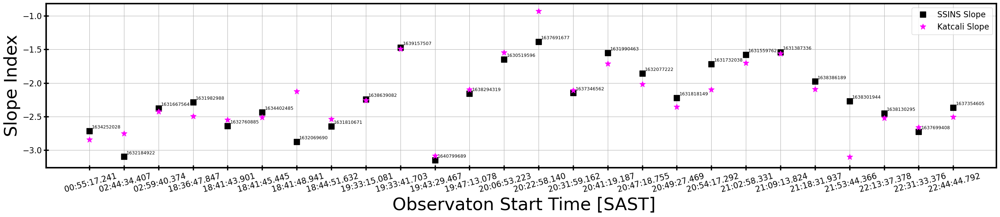

In [177]:
time = [sorted_by_time_of_day[f] for f in sorted_by_time_of_day.keys()]
slopes = [slope_ssins[f] for f  in sorted_by_time_of_day.keys()]
slopes_kat = [slope_kat[f] for f in sorted_by_time_of_day.keys()]

# Plot
plt.figure(figsize=(28, 6))
plt.plot(time, slopes, marker='s', ls='', label='SSINS Slope', ms=12, color='black')
plt.plot(time, slopes_kat, marker='*', ls='', label='Katcali Slope', color='magenta', ms=12)
plt.xlabel(" Observaton Start Time [SAST]", fontsize=35)
plt.ylabel("Slope Index", fontsize=35)
#plt.title("Brightness Distribution Slope vs Observing Date")
plt.grid(True)
for f, x, y in zip(sorted_by_time_of_day.keys(), time, slopes):
    plt.annotate(f, (x, y), textcoords="offset points", xytext=(5, 5), ha='left', fontsize=9)

plt.tight_layout()
plt.xticks(rotation=15)
plt.subplots_adjust(bottom=0.2)
plt.legend()
plt.grid(True)
ax = plt.gca()  # get current axes
for spine in ax.spines.values():
    spine.set_linewidth(3) 
ax.tick_params(which='both', width=2.5, length=10, direction='inout')
plt.savefig('start_time_slope')
plt.show()

In [69]:
common_files = set(sorted_by_time_of_day) & set(slope_ssins) & set(slope_kat)

In [134]:
time_26 = {}
for f in date26_all_end.keys():
    time_26[f] = date26_all_end[f][10:] 



from datetime import datetime

# First, remove " SAST"
cleaned_data = {k: v.replace(' SAST', '') for k, v in time_26.items()}

# Then sort by time of day
sorted_by_time_of_day_end = dict(sorted(
    cleaned_data.items(),
    key=lambda item: datetime.strptime(item[1].strip(), "%H:%M:%S.%f")
))

for k, v in sorted_by_time_of_day_end.items():
    print(f"{k}: '{v}'")


1638301944: ' 00:05:07.031'
1638130295: ' 00:25:36.028'
1637699408: ' 00:44:30.001'
1637354605: ' 00:50:05.611'
1634252028: ' 03:06:41.905'
1632184922: ' 04:50:11.218'
1631667564: ' 05:04:43.200'
1634402485: ' 20:39:00.469'
1631982988: ' 20:39:04.743'
1632760885: ' 20:42:54.825'
1632069690: ' 20:44:59.814'
1631810671: ' 20:47:12.526'
1638639082: ' 21:36:21.955'
1639157507: ' 21:38:58.523'
1638294319: ' 21:50:29.948'
1640799689: ' 21:54:12.149'
1630519596: ' 22:08:22.140'
1637691677: ' 22:26:21.008'
1637346562: ' 22:35:24.030'
1631990463: ' 22:36:30.263'
1632077222: ' 22:43:55.795'
1631818149: ' 22:46:26.500'
1631732038: ' 22:49:48.360'
1631559762: ' 22:59:35.371'
1631387336: ' 23:05:48.865'
1638386189: ' 23:28:36.635'


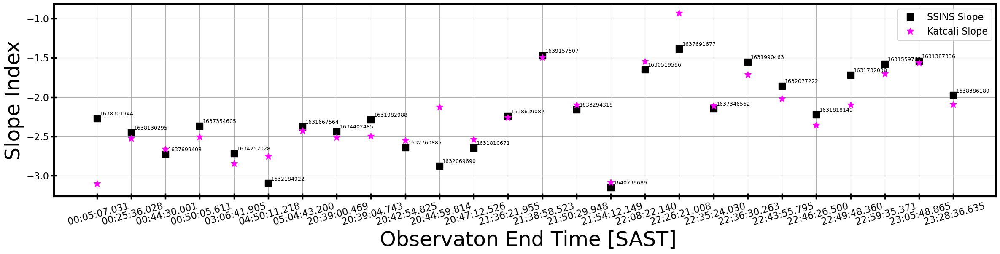

In [176]:
time = [sorted_by_time_of_day_end[f] for f in sorted_by_time_of_day_end.keys()]
slopes = [slope_ssins[f] for f  in sorted_by_time_of_day_end.keys()]
slopes_kat = [slope_kat[f] for f in sorted_by_time_of_day_end.keys()]

# Plot
plt.figure(figsize=(24, 6))
plt.plot(time, slopes, marker='s', ls='', label='SSINS Slope', ms=12, color='black')
plt.plot(time, slopes_kat, marker='*', ls='', label='Katcali Slope', color='magenta', ms=12)
plt.xlabel(" Observaton End Time [SAST]", fontsize=35)
plt.ylabel("Slope Index", fontsize=35)
#plt.title("Brightness Distribution Slope vs Observing Date")
plt.grid(True)
for f, x, y in zip(sorted_by_time_of_day_end.keys(), time, slopes):
    plt.annotate(f, (x, y), textcoords="offset points", xytext=(5, 5), ha='left', fontsize=9)

plt.tight_layout()
plt.xticks(rotation=15)
plt.subplots_adjust(bottom=0.2)
plt.legend()
plt.grid(True)
ax = plt.gca()  # get current axes
for spine in ax.spines.values():
    spine.set_linewidth(3) 
ax.tick_params(which='both', width=2.5, length=10, direction='inout')
plt.savefig('end_time_slope')
plt.show()

In [138]:
# unclear wht a slope is, but might imoly tyope rfi, dateti,e

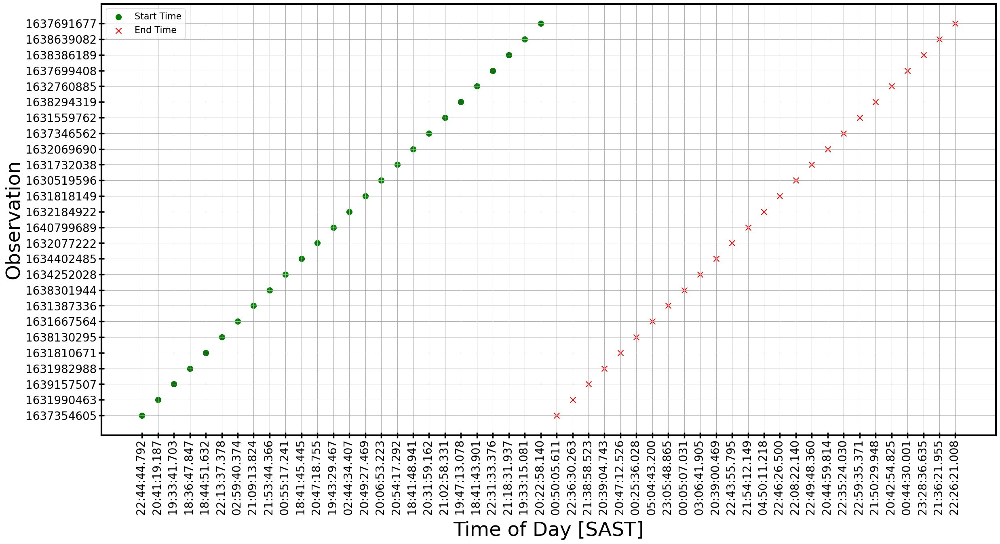

In [170]:
import matplotlib.pyplot as plt
from datetime import datetime

# 1) Extract cleaned start times
start_times = []
start_labels = []

for f in date26_all.keys():
    start_times.append(sorted_by_time_of_day[f])
    start_labels.append(f)
   

# 2) Extract cleaned end times (same order of files!)
end_times = []
for f in date26_all_end.keys():
    end_times.append(sorted_by_time_of_day_end[f])
    
# 3) Create a y-axis for plotting observations (just 0,1,2,...)
obs_indices = list(range(len(start_times)))
spacing_factor = 10  # increase this for more space between lines
obs_indices_spaced = obs_indices * spacing_factor
# 4) Plot
plt.figure(figsize=(25, 12))

plt.scatter(start_times, obs_indices, label='Start Time', color='green', marker='o', s=100)
plt.scatter(end_times, obs_indices, label='End Time', color='red', marker='x', s=100)

plt.yticks(obs_indices, start_labels, rotation=0, fontsize=20)  # label each line with observation file names

plt.xlabel('Time of Day [SAST]', fontsize=35)
plt.ylabel('Observation', fontsize=35)
#plt.title('Start and End Times for Observations')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.xticks(rotation=90, fontsize=20)

plt.grid(True)

plt.legend()

plt.grid(True)
ax = plt.gca()  # get current axes
for spine in ax.spines.values():
    spine.set_linewidth(3)  


ax.tick_params(which='both', width=2.5, length=10, direction='inout')
plt.savefig('obs_time')
plt.show()


In [ ]:
# this plot is independant of the observing data, we consider the time (start time of which the observation had began)

In [ ]:
time = [sorted_by_time_of_day[f] for f in sorted_by_time_of_day.keys()]
slopes = [slope_ssins[f] for f  in sorted_by_time_of_day.keys()]
slopes_kat = [slope_kat[f] for f in sorted_by_time_of_day.keys()]

# Plot
plt.figure(figsize=(28, 8))
plt.plot(time, slopes, marker='s', ls='', label='SSINS Slope', ms=12, color='black')
plt.plot(time, slopes_kat, marker='*', ls='', label='Katcali Slope', color='magenta', ms=12)
plt.xlabel(" Observaton Time [SAST]")
plt.ylabel("Slope Index")
plt.title("Brightness Distribution Slope vs Observing Date")
plt.grid(True)
for f, x, y in zip(common_files, time, slopes):
    plt.annotate(f, (x, y), textcoords="offset points", xytext=(5, 5), ha='left', fontsize=9)

plt.tight_layout()
plt.xticks(rotation=15)
plt.legend()
plt.show()

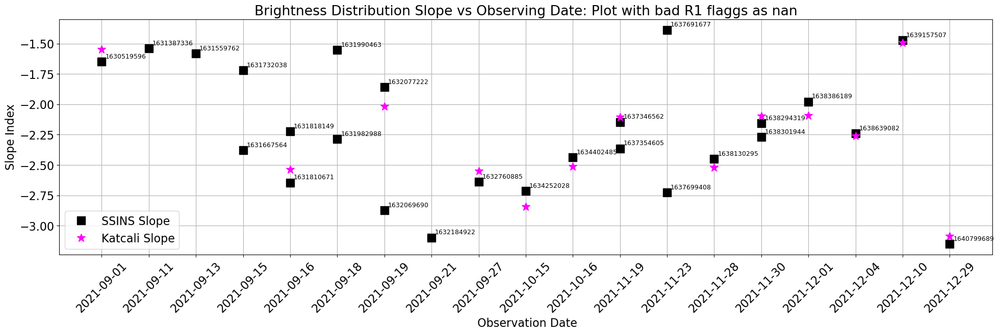

In [263]:
dates = [date26[f] for f in common_files]
slopes = [slope_ssins[f] for f in common_files]
slopes_kat = [slope_kat[f] for f in common_files]

# Plot
plt.figure(figsize=(20, 6))
plt.plot(dates, slopes, marker='s', ls='', label='SSINS Slope', ms=12, color='black')
plt.plot(dates, slopes_kat, marker='*', ls='', label='Katcali Slope', color='magenta', ms=12)
plt.xlabel(" Observation Date")
plt.ylabel("Slope Index")
plt.title("Brightness Distribution Slope vs Observing Date: Plot with bad R1 flaggs as nan")
plt.grid(True)
for f, x, y in zip(common_files, dates, slopes):
    plt.annotate(f, (x, y), textcoords="offset points", xytext=(5, 5), ha='left', fontsize=9)

plt.tight_layout()
plt.xticks(rotation=45)
plt.legend()
plt.show()

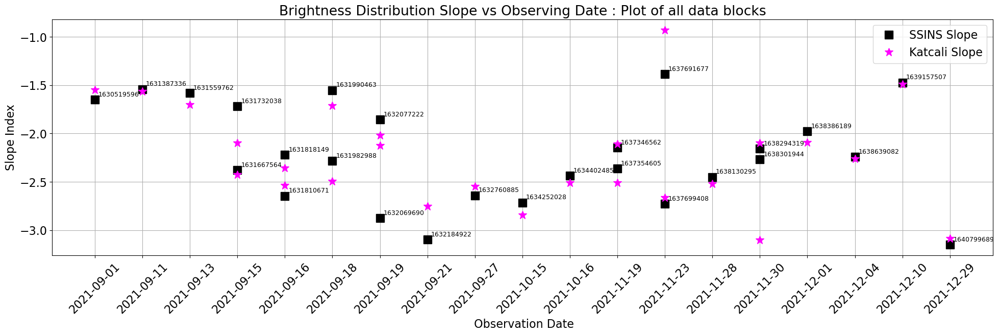

In [261]:
dates = [date26[f] for f in common_files]
slopes = [slope_ssins[f] for f in common_files]
slopes_kat = [slope_kat[f] for f in common_files]

# Plot
plt.figure(figsize=(20, 6))
plt.plot(dates, slopes, marker='s', ls='', label='SSINS Slope', ms=12, color='black')
plt.plot(dates, slopes_kat, marker='*', ls='', label='Katcali Slope', color='magenta', ms=12)
plt.xlabel(" Observation Date")
plt.ylabel("Slope Index")
plt.title("Brightness Distribution Slope vs Observing Date : Plot of all data blocks")
plt.grid(True)
for f, x, y in zip(common_files, dates, slopes):
    plt.annotate(f, (x, y), textcoords="offset points", xytext=(5, 5), ha='left', fontsize=9)

plt.tight_layout()
plt.xticks(rotation=45)
plt.legend()
plt.show()

In [ ]:
# plot percentage RFI occupancy vs the slope index, my hypothsis is that the steep the value of the slope index the more RFI is detected.
# plot the standard slope index values of LOFAR 

In [ ]:
# plot the mean RFI occupancy for the observing date

In [ ]:
# rm 689, should i only plot the slope index from what i know

In [208]:
fload = kio.load_data('1631818149')

In [209]:
print(fload)

Name: 1631818149_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: file:///idia/projects/hi_im/MEERKLASS-1/SCI-20210212-MS-01/1631818149/1631818149/1631818149_sdp_l0.full.rdb
Observer: Sean Passmoor  Experiment ID: 20210916-0046
Description: 'HI Intensity observation RISING epoch 9 offset=20'
Observed from 2021-09-16 20:49:26.470 SAST to 2021-09-16 22:46:27.499 SAST
Dump rate / period: 0.50021 Hz / 1.999 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m014,m015,m016,m017,m018,m019,m020,m021,m022,m023,m024,m025,m026,m027,m028,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m042,m043,m044,m045,m046,m047,m048,m049,m050,m051,m052,m053,m054,m055,m056,m057,m058,m059,m061,m062,m063  124      248
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 L    c856M4k    1284.000  

In [ ]:
# plot the time of the observation and see how the slope values deviate
# maybe we expect on 9/16 and 9/27 that these will have similar observing times because they have same slope index values

In [92]:
from scipy.stats import pearsonr
r, _ = pearsonr(slopes, slopes_kat)


In [96]:
r * 100


np.float64(97.87690714025969)

In [106]:
relative_errors = [abs(s - k) / abs(s) for k, s in zip(slopes, slopes_kat)]
mean_relative_error = np.std(relative_errors) 
agreement =  mean_relative_error


In [107]:
agreement

np.float64(0.02117712244236284)

In [ ]:
# per reicever slope of the mkat array.

In [ ]:
# plot the brightness distribution for a block for h and v to get the final plots for the brightness distirbution.
